# Setup

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore")

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving marketing_campaign.csv to marketing_campaign.csv


In [ ]:
df = pd.read_csv('marketing_campaign.csv', sep='\t')

In [ ]:
backup_df = df.copy()

# Set Constraints and Styling Options

In [ ]:
pd.set_option("display.max_columns", None)

In [ ]:
# setting plotting options

sns.set_style("white")
sns.set(rc={"axes.facecolor":"#cce0ff", "figure.facecolor":"#cce0ff"})
sns.set_context("poster", font_scale= 0.7)

# Basic Data Understanding

In [ ]:
[id for id, count in df.ID.value_counts().items() if count == 2]

[]

- Interpreation : ID column have single entry for each customer, no aggregation computation.


In [ ]:
# Drop ID Column

df.drop('ID', axis = 1, inplace = True)

In [ ]:
def basic_preprocessing(df):
    # check columns
    print("\nColumns of Dataframe : ")
    display(df.columns)

    # check shape
    print("\nShape of Dataframe : ")
    display(df.shape)

    # check info
    print("\nCheck Dataframe info : ")
    df.info()

    # Statistical Summary
    print("\nCheck the Statistical Summary of Dataframe : ")
    display(df.describe())

    # Statistical Summary of Categorical Features
    print("\nCheck the Categorical Features Statistical Summary of Dataframe : ")
    display(df.describe(include='object'))

    # show 5 rows
    print("\nShow Top 5 Rows of Dataframe : ")
    display(df.head())

In [ ]:
basic_preprocessing(df)


Columns of Dataframe : 


Index(['Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'],
      dtype='object')


Shape of Dataframe : 


(2240, 28)


Check Dataframe info : 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Year_Birth           2240 non-null   int64  
 1   Education            2240 non-null   object 
 2   Marital_Status       2240 non-null   object 
 3   Income               2216 non-null   float64
 4   Kidhome              2240 non-null   int64  
 5   Teenhome             2240 non-null   int64  
 6   Dt_Customer          2240 non-null   object 
 7   Recency              2240 non-null   int64  
 8   MntWines             2240 non-null   int64  
 9   MntFruits            2240 non-null   int64  
 10  MntMeatProducts      2240 non-null   int64  
 11  MntFishProducts      2240 non-null   int64  
 12  MntSweetProducts     2240 non-null   int64  
 13  MntGoldProds         2240 non-null   int64  
 14  NumDealsPurchases    2240 non-null   int64  
 15  NumWebPurchas

,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,44.021875,2.325000,4.084821,2.662054,5.790179,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,52.167439,1.932238,2.778714,2.923101,3.250958,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,24.000000,2.000000,4.000000,2.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,15.000000,27.000000,28.000000,13.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000



Check the Categorical Features Statistical Summary of Dataframe : 


,Education,Marital_Status,Dt_Customer
count,2240,2240,2240
unique,5,8,663
top,Graduation,Married,31-08-2012
freq,1127,864,12



Show Top 5 Rows of Dataframe : 


,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


# Duplicate Handling

In [ ]:
# Remove duplicates
print("\nRemove Duplicates : ")
print(f"\nTotal {df.duplicated().sum()} Duplicate values removed")
df.drop_duplicates(inplace=True)


Remove Duplicates : 

Total 182 Duplicate values removed


# Data Type Fixing

In [ ]:
# Check Dtypes
print("\nCheck Data Types : ")
display(df.dtypes)


Check Data Types : 


,0
Year_Birth,int64
Education,object
Marital_Status,object
Income,float64
Kidhome,int64
Teenhome,int64
Dt_Customer,object
Recency,int64
MntWines,int64
MntFruits,int64


In [ ]:
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], format="%d-%m-%Y")

# Null / Missing Value Handling

In [ ]:
# check missing values
print("\nCheck the Null Values of each columns : ")
display(df.isnull().any(axis=1).sum())


Check the Null Values of each columns : 


np.int64(24)

In [ ]:
features_with_Nan = [i for i in df.columns if df[i].isnull().sum() >= 1]
for feature in features_with_Nan:
  print(f"Total Percentage of Missing Value in {feature} column: ",(df[feature].isnull().mean() * 100).round(2))

Total Percentage of Missing Value in Income column:  1.17


In [ ]:
# Drop null values from the Income column
df['Income'].fillna(df['Income'].median(), inplace = True)

# Outlier Detection & Treatment

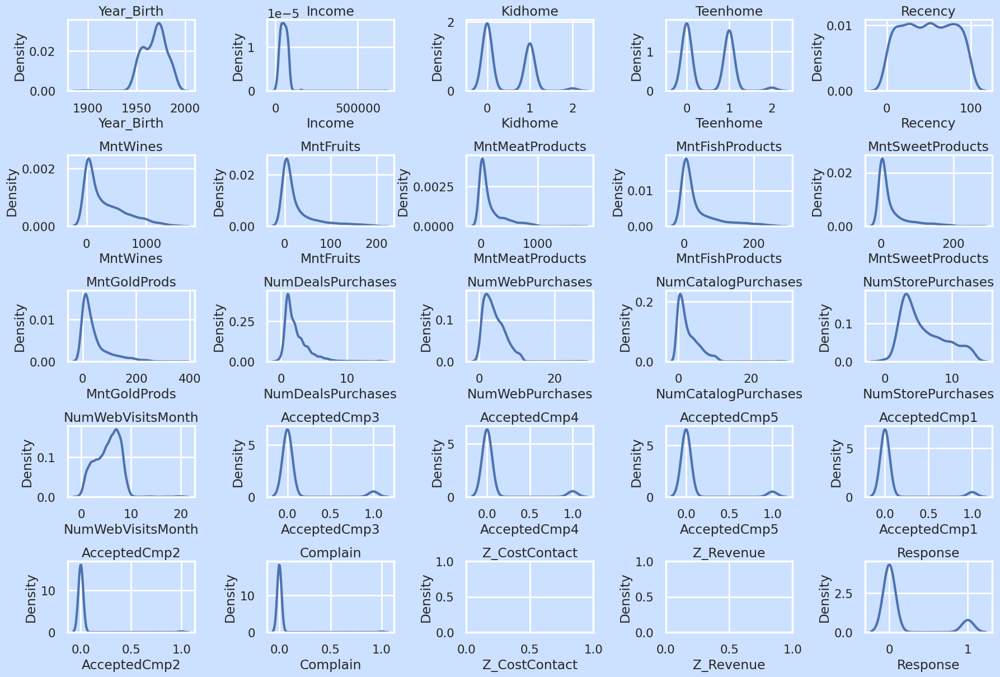

In [ ]:
cols = df.select_dtypes(include=['int','float']).columns.tolist()

plt.figure(figsize=(18,14))

for i, col in enumerate(cols, 1):
  plt.subplot(6, 5, i)
  sns.kdeplot(df[col], warn_singular=False)
  plt.title(col)
  plt.grid(True)


plt.tight_layout(pad=0.8)
plt.show()

- Observation :
- 1. Year_Birth column is left skewed, Most of the people are in between 1940 to 2000+
- 2. Keedhome and Teenhome is Multimodal distribution, variance is around 1 and 0
- 3. Recency have Nomral distribution
- 4. MintWines, Mintfruits, Mintmeatproducts, Mintfishproducts, Mintsweetproducts, Mintgoldproducts are right skewed, some data lie in right side which is away from mean of curve
- 5. Numdealspurchases, Numwebpurchases, Numcatalogpurchases, Numstorepurchases, Numwebvisitmonth are right skewed
- 6. Z_CostContact and Z_Revenue both are have no variance so we remove it

In [ ]:
df.drop(['Z_CostContact', 'Z_Revenue'], axis = 1, inplace=True)

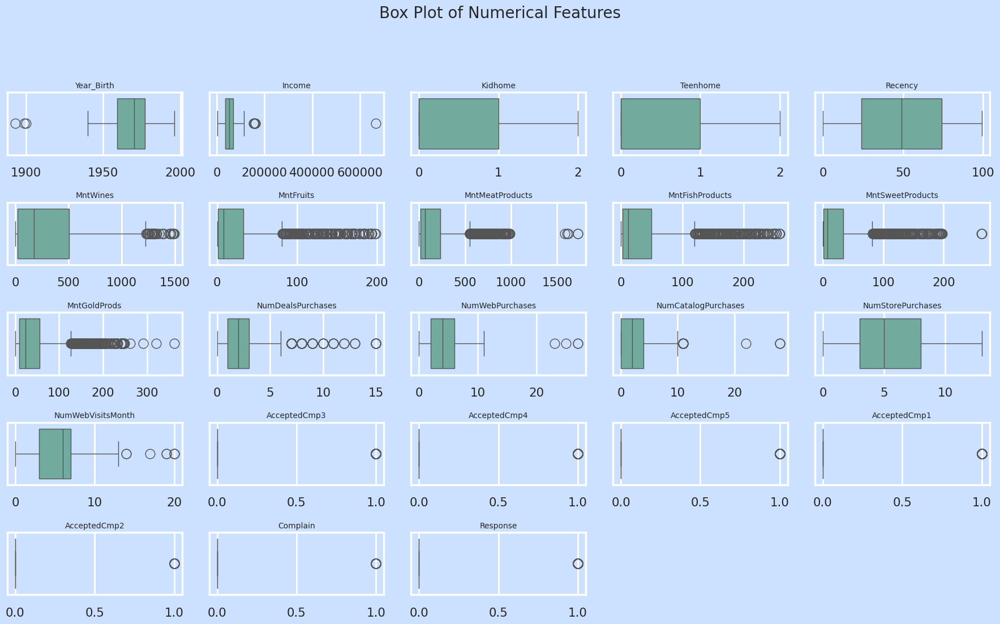

In [ ]:
cols = df.select_dtypes(include=['int', 'float']).columns.tolist()

plt.figure(figsize=(18, 12))
plt.suptitle('Box Plot of Numerical Features', fontsize=20, y=1.05)

for i, col in enumerate(cols, 1):
    plt.subplot(6, 5, i)
    sns.boxplot(x=col, data=df, color="#69b3a2")
    plt.title(col, fontsize=10)
    plt.xlabel('')
    plt.ylabel('')

plt.tight_layout(pad=1.0)
plt.show()





Year_Birth — The distribution is fairly concentrated between 1940–1980, with a few extreme outliers on the lower end (very old customers born around 1900). The median sits around 1970, suggesting a middle-aged customer base dominates.



Income — Strongly right-skewed with a tight IQR and notable high-income outliers (one extreme point near 600,000). Most customers cluster in a lower income range, but the long right tail indicates a small segment of very high earners.



Kidhome & Teenhome — Both variables are discrete (0, 1, 2) with the box heavily concentrated at 0–1. Kidhome shows a wider box, suggesting more variability in having kids at home compared to teens.



Recency — Nearly uniform distribution with a wide IQR, suggesting customers vary broadly in how recently they made a purchase. No strong skew — recency is spread across the full 0–100 range.



MntWines — Heavily right-skewed with a compressed IQR near zero and a long tail of high spenders. A cluster of outliers exists beyond 1000, indicating a small group of heavy wine buyers.



MntFruits, MntFish, MntSweet, MntGold — All show similarly skewed patterns — small IQR near the lower end with dense clusters of outliers, meaning most customers spend very little, but a few spend heavily.



MntMeatProducts — Slightly wider IQR than fruits/fish/sweet, with outliers extending past 1500. More spread than other food categories, indicating greater variability in meat spending behavior.



NumDealsPurchases — Right-skewed with outliers near 15. Most customers make very few deal purchases (IQR near 0–5), but a small group are heavy deal users.



NumWebPurchases — Moderate spread with IQR around 2–8, and a few outliers near 20–25. More evenly distributed than deal purchases — web buying is more common across the customer base.



NumCatalogPurchases — Tight IQR with a long right tail and sparse high outliers near 20–28. Most customers use catalogs rarely or not at all.



NumStorePurchases — Wider and more symmetric IQR compared to other purchase channels, suggesting store purchases are the most consistently used channel across customers.



NumWebVisitsMonth — Moderately skewed with a few outliers. The IQR suggests most customers visit the website between 1–7 times per month, with a small segment of very frequent visitors.



AcceptedCmp3, Cmp4, Cmp5, Cmp1 — Boxes appear extremely compressed near zero with isolated high outliers, confirming these are binary (0/1) acceptance flags with very low overall acceptance rates across the dataset.





Let's have a look on the distribution of customer's income and spending :


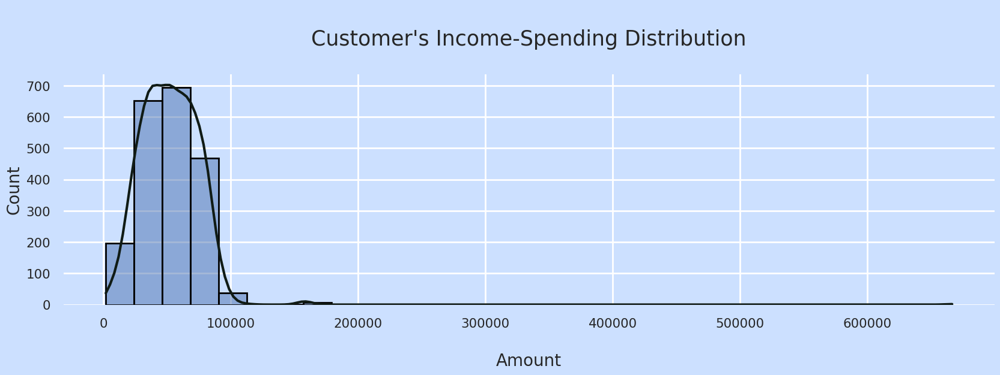

In [ ]:
print(f"Let's have a look on the distribution of customer's income and spending :")
plt.subplots(figsize=(20,5))
p = sns.histplot(df['Income'], palette=["#66ffff","#3385ff"], kde=True, bins=30,fill=True, edgecolor='black')
p.axes.lines[0].set_color('#101B15')
p.axes.set_yscale('linear')
p.axes.set_title("\nCustomer's Income-Spending Distribution\n",fontsize=25)
plt.ylabel("Count",fontsize=20)
plt.xlabel("\nAmount",fontsize=20)
sns.despine(left=True, bottom=True)

plt.show()

- Income column is Right skewed, Few peoples have 180000+ income (Rich people)

In [ ]:
def get_outliers(df, col):
    # Calculate IQR
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    upper = q3 + 1.5 * iqr
    lower = q1 - 1.5 * iqr

    # Filter outliers
    outliers = df[(df[col] > upper) | (df[col] < lower)][[col]]
    return outliers

In [ ]:
outliers_of_income = get_outliers(df, 'Income')
outlier_indices = outliers_of_income.index

outliers_df = df.loc[outlier_indices]

In [ ]:
# last row shows 600000+ income which can't make sense so we remove it
outliers_df = outliers_df.iloc[:-1,:]

In [ ]:
outliers_df

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
164,1973,PhD,Married,157243.0,0,1,2014-03-01,98,20,2,1582,1,2,1,15,0,22,0,0,0,0,0,0,0,0,0
617,1976,PhD,Together,162397.0,1,1,2013-06-03,31,85,1,16,2,1,2,0,0,0,1,1,0,0,0,0,0,0,0
655,1975,Graduation,Divorced,153924.0,0,0,2014-02-07,81,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0
687,1982,PhD,Married,160803.0,0,0,2012-08-04,21,55,16,1622,17,3,4,15,0,28,1,0,0,0,0,0,0,0,0
1300,1971,Master,Together,157733.0,1,0,2013-06-04,37,39,1,9,2,0,8,0,1,0,1,1,0,0,0,0,0,0,0
1653,1977,Graduation,Together,157146.0,0,0,2013-04-29,13,1,0,1725,2,1,1,0,0,28,0,1,0,0,0,0,0,0,0
2132,1949,PhD,Married,156924.0,0,0,2013-08-29,85,2,1,2,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0


## Observation:
High-income customers show strong spending in Meat products but zero campaign response, indicating a premium self-driven segment that is not discount-motivated.


In [ ]:
# Outlier Removal of Income

Q1 = df['Income'].quantile(0.25)
Q3 = df['Income'].quantile(0.75)
IQR = Q3 - Q1
df = df[(df['Income'] >= Q1 - 1.5*IQR) & (df['Income'] <= Q3 + 1.5*IQR)]

# Univariate Analysis

Let's have a look on the distribution of customer's income and spending :


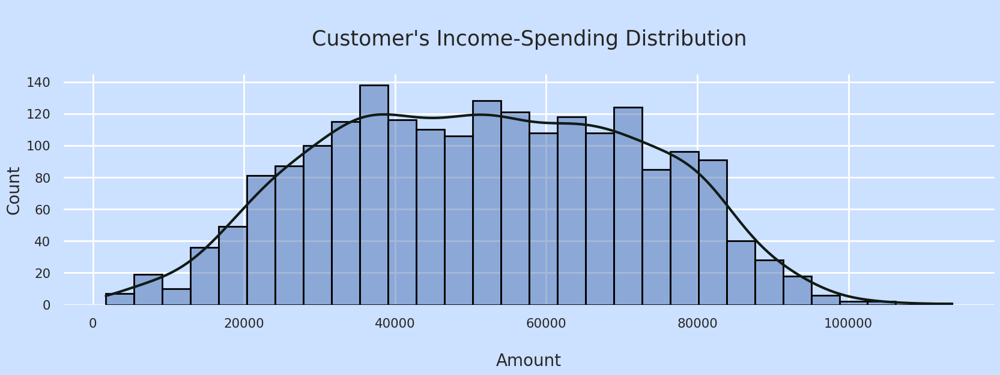

In [ ]:
print(f"Let's have a look on the distribution of customer's income and spending :")
plt.subplots(figsize=(20,5))
p = sns.histplot(df['Income'], palette=["#66ffff","#3385ff"], kde=True, bins=30,fill=True, edgecolor='black')
p.axes.lines[0].set_color('#101B15')
p.axes.set_yscale('linear')
p.axes.set_title("\nCustomer's Income-Spending Distribution\n",fontsize=25)
plt.ylabel("Count",fontsize=20)
plt.xlabel("\nAmount",fontsize=20)
sns.despine(left=True, bottom=True)

plt.show()

In [ ]:
df.select_dtypes(
    include=['float', 'int']).\
    skew().\
    to_frame(name='Skewness').\
    style.background_gradient(cmap="viridis")

,Skewness
Year_Birth,-0.372330
Income,0.005667
Kidhome,0.621500
Teenhome,0.408017
Recency,-0.000092
MntWines,1.169470
MntFruits,2.102367
MntMeatProducts,1.902837
MntFishProducts,1.924978
MntSweetProducts,2.144486


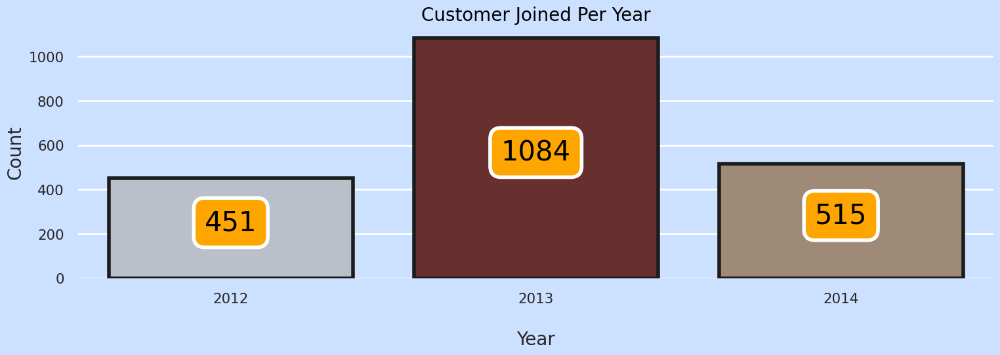

In [ ]:
# Customer Joined Per Year

plt.subplots(figsize=(18,5))
p = sns.countplot(x=df['Dt_Customer'].dt.year, palette=["#B9C0C9","#682F2F", "#9F8A78"], saturation=1,edgecolor = "#1c1c1c", linewidth = 4)
p.axes.set_title("Customer Joined Per Year", color="black", fontsize=20)
p.axes.set_ylabel("Count",fontsize=20)
p.axes.set_xlabel("\nYear",fontsize=20)
p.axes.set_xticklabels(p.get_xticklabels(),rotation = 0)
for container in p.containers:
    p.bar_label(container,label_type="center",padding=6,size=30,color="black",rotation=0,
    bbox={"boxstyle": "round", "pad": 0.4, "facecolor": "orange", "edgecolor": "white", "linewidth" : 4, "alpha": 1})

sns.despine(left=True, bottom=True)
plt.show()

- Observation:
- Most of the Customer is joined on 2013

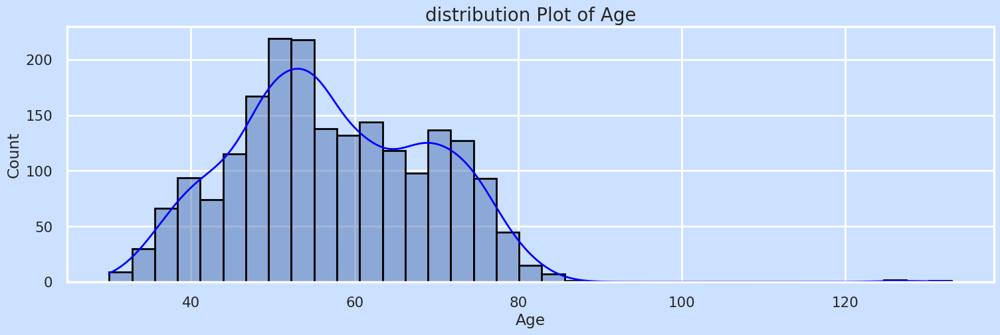

In [ ]:
##  creating a new field to store the Age of the customer

df['Age']=2026-df['Year_Birth']

plt.subplots(figsize=(18,5))
p = sns.histplot(df['Age'], kde=True, edgecolor='black')
p.axes.lines[0].set(color='blue', linewidth=2)
p.axes.set_title("distribution Plot of Age", fontsize=20)
plt.show()

- Most of the Customer's Age lie between 42 to 62

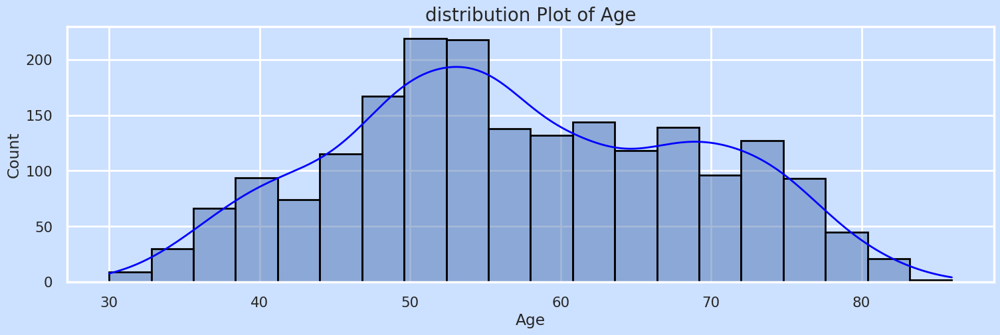

In [ ]:
##  creating a new field to store the Age of the customer

df = df[df['Age'] < 90]

plt.subplots(figsize=(18,5))
p = sns.histplot(df['Age'], kde=True, edgecolor='black')
p.axes.lines[0].set(color='blue', linewidth=2)
p.axes.set_title("distribution Plot of Age", fontsize=20)
plt.show()

Let's have a look on the customer's education :


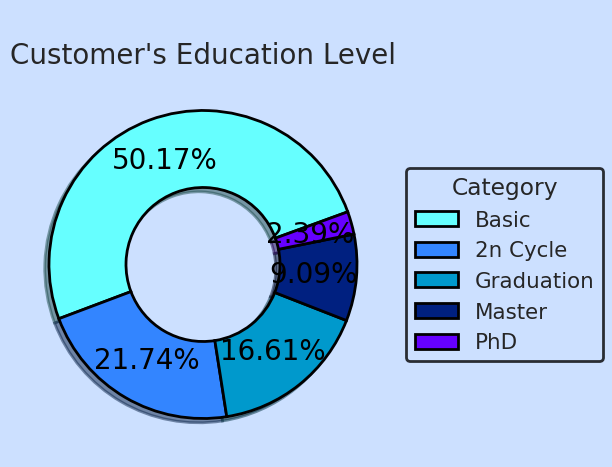

In [ ]:
print(f"Let's have a look on the customer's education :")
plt.subplots(figsize=(20,5))

lables = "Basic","2n Cycle", "Graduation", "Master", "PhD"
size = 0.5

wedges, texts, autotexts = plt.pie([df['Education'].value_counts()[0],
                                   df['Education'].value_counts()[1],
                                   df['Education'].value_counts()[2],
                                   df['Education'].value_counts()[3],
                                   df['Education'].value_counts()[4]],
                                   autopct="%.2f%%",
                                   textprops=dict(size=20, color="black"),
                                   radius=1,
                                   explode=(0,0,0,0,0),
                                   pctdistance=0.72,
                                   colors=["#66ffff","#3385ff","#0099cc","#002080","#6600ff"],
                                   shadow=True,
                                   wedgeprops=dict(width = size,edgecolor="black", linewidth=2),
                                   startangle=20)

plt.legend(wedges, lables, title="Category", loc="center left",bbox_to_anchor=(1,0,0.5,1), edgecolor="black")
plt.title("\nCustomer's Education Level", fontsize=20)
plt.show()

# Bivariate Analysis

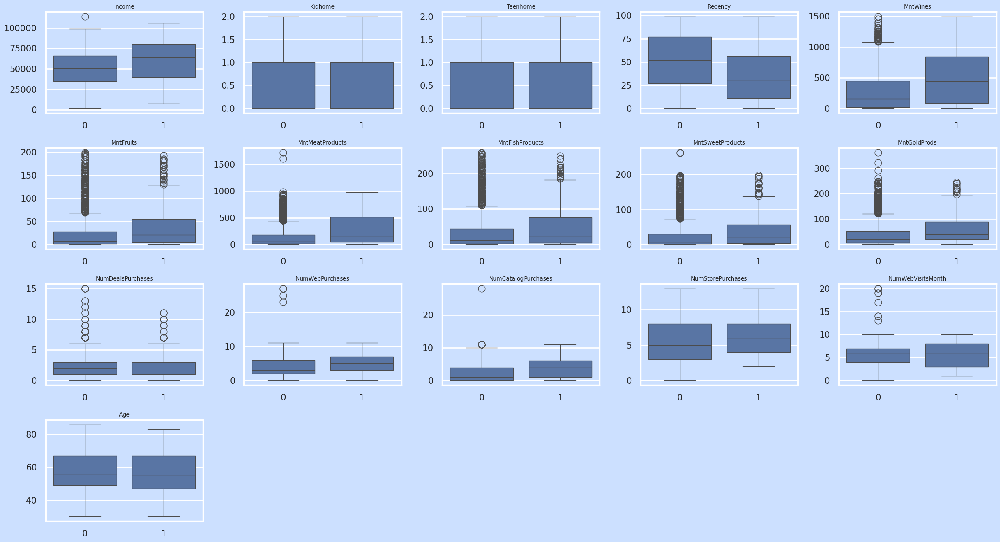

In [ ]:
cols = [col for col in df.columns if col not in ['Year_Birth', 'Education','Marital_Status','Dt_Customer','Response',
                                                'Total_Accepted_Campaigns','Total_Num_Products_Purchase','Total_Amount_Spent','AcceptedCmp1','AcceptedCmp2',
                                                 'AcceptedCmp3','AcceptedCmp4','AcceptedCmp5', 'Complain']]

plt.figure(figsize=(25,20))  # large enough for 6x5 grid

for i, col_name in enumerate(cols, 1):
    plt.subplot(6, 5, i)
    sns.boxplot(x='Response', y=col_name, data=df)
    plt.title(f'{col_name}', fontsize=10)
    plt.xlabel('')
    plt.ylabel('')

plt.tight_layout()
plt.show()

- Income — Response=1 has a clearly higher median income ~70,000 compared to Response=0 ~47,000. The IQR for Response=1 is also positioned higher with less spread, confirming that higher-income customers are significantly more likely to respond — strong predictor.
- Kidhome — Response=1 box sits lower, meaning customers who responded tend to have fewer or no kids at home. Response=0 has a wider IQR spanning 0–1. Having kids at home appears to reduce campaign response — moderate predictor.
- Teenhome — Similar pattern to Kidhome. Response=1 leans toward 0 teens, while Response=0 spreads more across 0–1. Customers with teenagers are less likely to respond — moderate predictor.
- Recency — Response=0 has a higher median ~50 and wider IQR, while Response=1 has a clearly lower median ~25 and compressed box. Customers who purchased more recently are far more likely to respond — strong predictor.
- MntWines — Response=1 box is dramatically higher median ~450 vs Response=0 median ~100. This is one of the strongest visual separations in the entire plot — strongest predictor among spending features.
- MntFruits — Response=1 has a noticeably higher median and wider IQR. Both groups have many outliers, but the box for Response=1 sits clearly higher — moderate-to-strong predictor.
- MntMeatProducts — Response=1 box is substantially higher with a median around 400–450 vs Response=0 near 50. Very clear separation with significant outliers in both groups — strong predictor.
- MntFishProducts — Response=1 box is higher ~60–70 median vs Response=0 ~15 median. Dense outlier clusters appear in both groups but the IQR shift is meaningful — moderate predictor.
- MntSweetProducts — Response=1 box is clearly elevated compared to Response=0. Pattern mirrors MntFruits and MntFish — higher spenders respond more — moderate predictor.
- MntGoldProds — Response=1 has a noticeably higher box and wider IQR. Gold product spending correlates with campaign response, though with more variability — moderate predictor.
- NumDealsPurchases — Both boxes sit at nearly the same position with similar medians around 2. Minimal separation between groups — weak predictor. Deal-seeking behavior does not distinguish responders.
- NumWebPurchases — Response=1 box is slightly higher with a median around 4–5 vs ~3 for Response=0. Some separation, but moderate overlap — weak-to-moderate predictor.
- NumCatalogPurchases — Response=1 box is clearly higher ~4–5 median vs Response=0 ~1–2. A strong visual shift with Response=1 showing much greater catalog usage — strong predictor.
- NumStorePurchases — Both groups show very similar box positions with nearly identical medians around 5–6. Boxes overlap almost entirely — weak predictor. Store purchasing behavior does not differentiate responders.
- NumWebVisitsMonth — Both boxes are nearly identical in position and spread, with similar medians around 5–6. Frequent web visits alone do not predict campaign response — weak predictor.
- Age — Both Response=0 and Response=1 show nearly identical median age ~55–60 and IQR ranges. Response=0 has one extreme outlier near 130, likely a data error. Age provides virtually no separation between groups — very weak predictor.

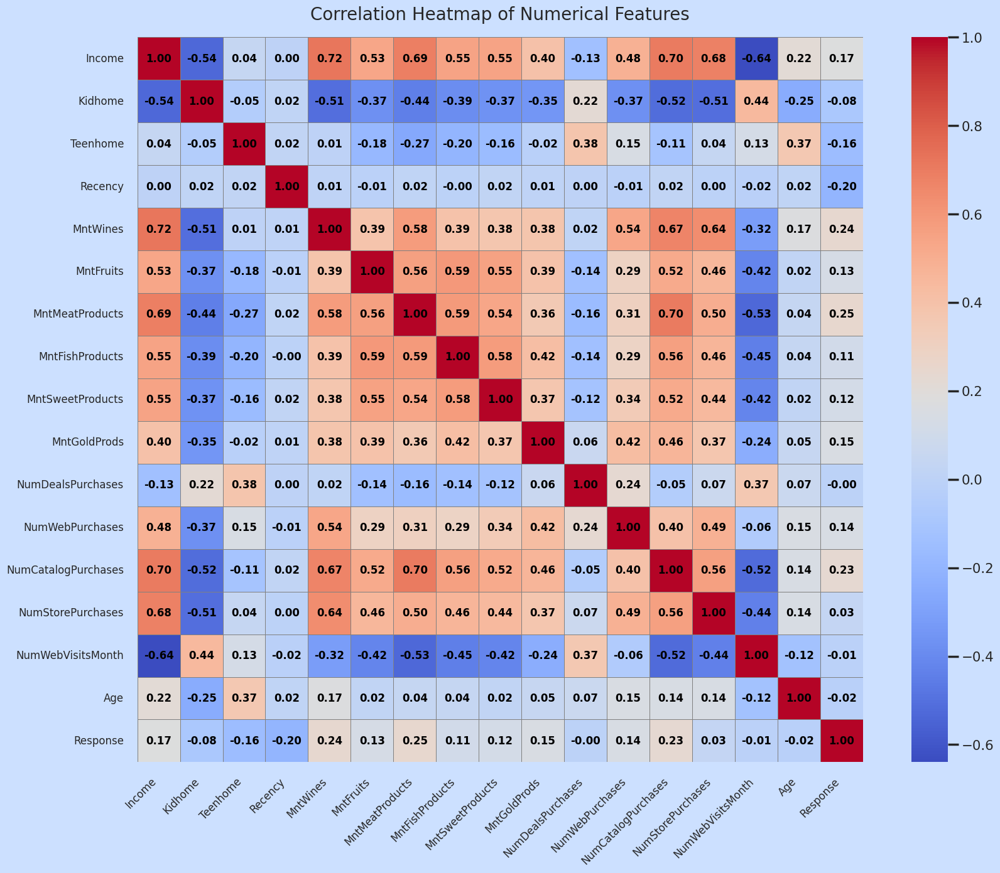

In [ ]:
plt.subplots(figsize=(20,15))

corr = df[cols + ['Response']].corr()

# Heatmap
sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",        # round to 2 decimals
    cmap="coolwarm",
    cbar=True,
    linewidths=0.5,
    linecolor='gray',
    annot_kws={"size":12, "weight":"bold", "color":"black"},
    square=True
)

plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(rotation=0, fontsize=12)
plt.title("Correlation Heatmap of Numerical Features", fontsize=20, pad=20)
plt.show()


- Observation:
- NumwebvisitMonth and Numstorepurchases have negative corr which is absolutely genuine because who purchased the products on store they visits website less
- Numwebvisit and Response has negative corr so whoever visits website daily there is less chance of purchasing products
- you can see teenhome and keedhome have also negative corr means big family has low purchase or Response rate
- Income and Numcatalogpurchase is positively correlated
- Numwebvisitmonth and Income has strong negative correlation means high income person less buy on website compare to catalogpurchase and store purchase
- High income persons spend money on Wines purchasing more than other
- Kidhome and Income has negative correlation which absolutely a correct and genuine sign

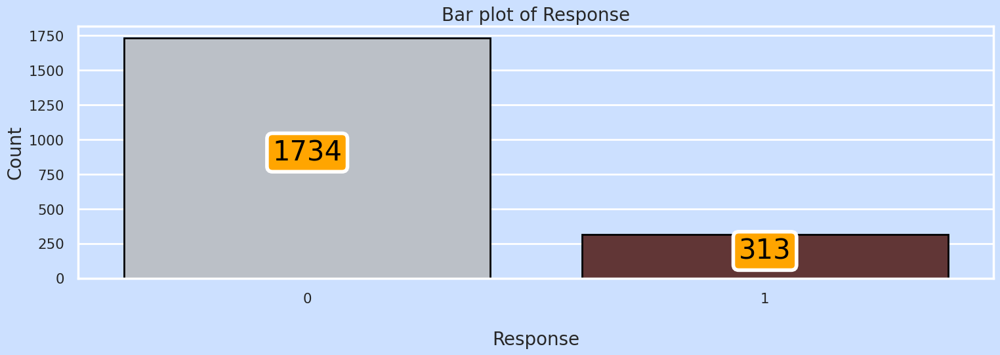

In [ ]:
plt.subplots(figsize=(18,5))
p = sns.barplot(x = ['0','1'], y = df['Response'].value_counts(), palette=["#B9C0C9","#682F2F"], edgecolor = "#000000")
p.axes.set_title("Bar plot of Response", fontsize=20)
p.axes.set_ylabel("Count",fontsize=20)
p.axes.set_xlabel("\nResponse",fontsize=20)

for container in p.containers:
    p.bar_label(container,label_type="center",padding=6,size=30,color="black",rotation=0,
    bbox={"boxstyle": "round", "pad": 0.2, "facecolor": "orange", "edgecolor": "white", "linewidth" : 4, "alpha": 1})

plt.show()

- Observation : Class imbalance, There is high weighted amount of Non Response compare to Response

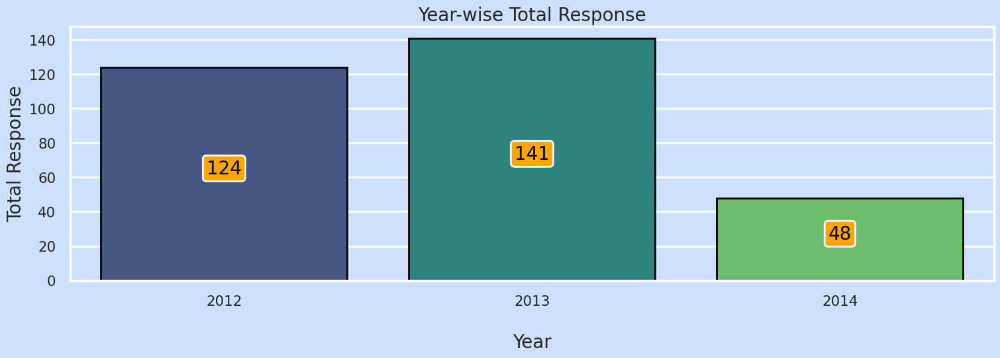

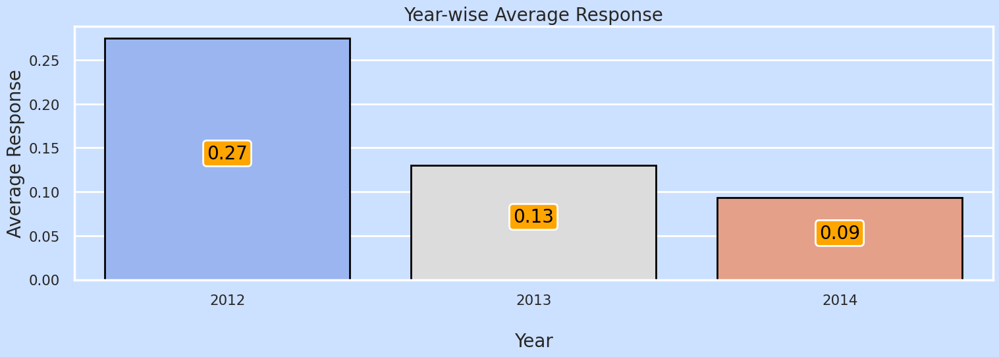

In [ ]:
# Aggregate yearly response
agg_df = df.groupby(df['Dt_Customer'].dt.year.rename('Year'))['Response'].agg(['sum', 'mean']).reset_index()

# Total Response
plt.subplots(figsize=(18,5))
p = sns.barplot(x=agg_df['Year'], y=agg_df['sum'], palette="viridis", edgecolor="#000000")
p.axes.set_title("Year-wise Total Response", fontsize=20)
p.axes.set_ylabel("Total Response", fontsize=20)
p.axes.set_xlabel("\nYear", fontsize=20)

for container in p.containers:
    p.bar_label(container, labels=[f'{int(v)}' for v in container.datavalues],
                label_type="center", padding=6, size=20, color="black",
                bbox={"boxstyle": "round", "pad": 0.2, "facecolor": "orange",
                      "edgecolor": "white", "linewidth": 2, "alpha": 1})
plt.show()

# Average Response
plt.subplots(figsize=(18,5))
p = sns.barplot(x=agg_df['Year'], y=agg_df['mean'], palette="coolwarm", edgecolor="#000000")
p.axes.set_title("Year-wise Average Response", fontsize=20)
p.axes.set_ylabel("Average Response", fontsize=20)
p.axes.set_xlabel("\nYear", fontsize=20)

for container in p.containers:
    p.bar_label(container, labels=[f'{v:.2f}' for v in container.datavalues],
                label_type="center", padding=6, size=20, color="black",
                bbox={"boxstyle": "round", "pad": 0.2, "facecolor": "orange",
                      "edgecolor": "white", "linewidth": 2, "alpha": 1})
plt.show()

- Observation : Yearly Average Growth rate of Response is decreased (Customer Churn)

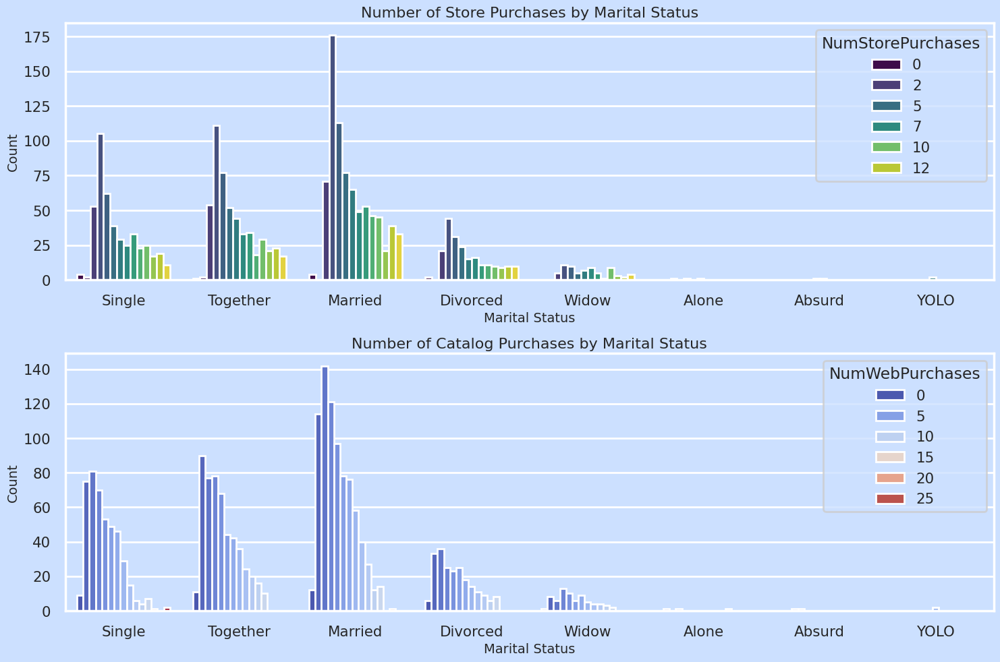

In [ ]:
fig, axes = plt.subplots(2, 1, figsize=(15,10))  # 2 vertical plots

sns.countplot(x='Marital_Status', hue='NumStorePurchases', data=df, ax=axes[0], palette="viridis")
axes[0].set_title("Number of Store Purchases by Marital Status", fontsize=16)
axes[0].set_xlabel("Marital Status", fontsize=14)
axes[0].set_ylabel("Count", fontsize=14)

sns.countplot(x='Marital_Status', hue='NumWebPurchases', data=df, ax=axes[1], palette="coolwarm")
axes[1].set_title("Number of Web Purchases by Marital Status", fontsize=16)
axes[1].set_xlabel("Marital Status", fontsize=14)
axes[1].set_ylabel("Count", fontsize=14)

plt.tight_layout(pad=0.8)
plt.show()

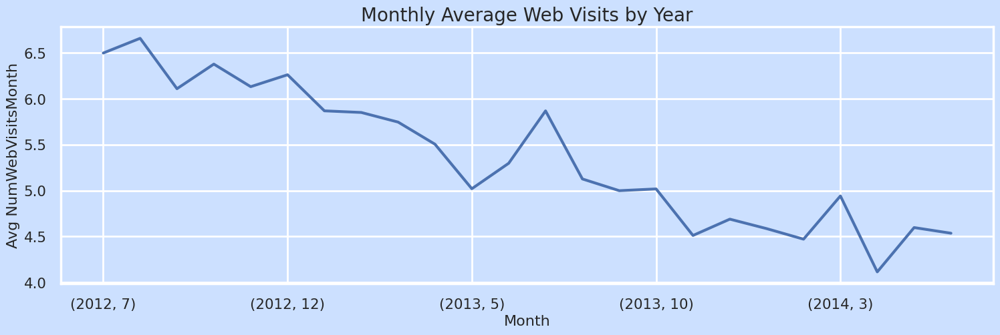

In [ ]:
plt.figure(figsize=(18,5))

p = df.groupby([df['Dt_Customer'].dt.year.rename('Year'),
           df['Dt_Customer'].dt.month.rename('Month')])['NumWebVisitsMonth'].mean().plot()

p.set_title("Monthly Average Web Visits by Year", fontsize=20)
p.set_xlabel("Month", fontsize=16)
p.set_ylabel("Avg NumWebVisitsMonth", fontsize=16)
plt.show()

# Feature Engineering

In [ ]:
accepted_cols = [ 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2']

df['Total_Accepted_Campaigns'] = df[accepted_cols].sum(axis=1)

In [ ]:
total_num__products_purchase = ['NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases']

df['Total_Num_Products_Purchase'] = df[total_num__products_purchase].sum(axis=1)

In [ ]:
total_amount_spent = ['MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds']

df['Total_Amount_Spent'] = df[total_amount_spent].sum(axis=1)

In [ ]:
numerical_features = ['Year_Birth','Income','Kidhome','Teenhome','Recency','MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds','NumDealsPurchases',
 'NumWebPurchases','NumCatalogPurchases', 'NumStorePurchases','NumWebVisitsMonth']

categorical_features = ['Education','Marital_Status']

binary_cols = ['AcceptedCmp1','AcceptedCmp2','AcceptedCmp3','AcceptedCmp4','AcceptedCmp5','Complain','Response']

df['Customer_Tenure'] = (pd.Timestamp('today') - df['Dt_Customer']).dt.days

In [ ]:
df['Frequency'] = df['Total_Num_Products_Purchase']
df['Monetry'] = df['Total_Amount_Spent']

# Recency: low value is better
df['R_score'] = pd.qcut(df['Recency'], 4, labels=[4,3,2,1])

# Frequency: high value is better
df['F_score'] = pd.qcut(df['Frequency'], 4, labels=[1,2,3,4])

# Monetary: high value is better
df['M_score'] = pd.qcut(df['Monetry'], 4, labels=[1,2,3,4])

# Income_flag : high value is better
df['Income_flag'] = pd.qcut(df['Income'], 3, labels=['Low Income', 'Average Income', 'High Income'])

df['RFM_Score'] = df['R_score'].astype(str) + \
                  df['F_score'].astype(str) + \
                  df['M_score'].astype(str)

In [ ]:
def segment_customer(row):
    if row['RFM_Score'] == '444':
        return 'Best Customers'
    elif row['F_score'] == 4:
        return 'Loyal Customers'
    elif row['R_score'] == 1:
        return 'At Risk'
    else:
        return 'Regular'

df['Segment'] = df.apply(segment_customer, axis=1)

print("Segmentation of Group : \n", df['Segment'].value_counts())

Segmentation of Group : 
 Segment
Regular            1195
Loyal Customers     420
At Risk             384
Best Customers       48
Name: count, dtype: int64


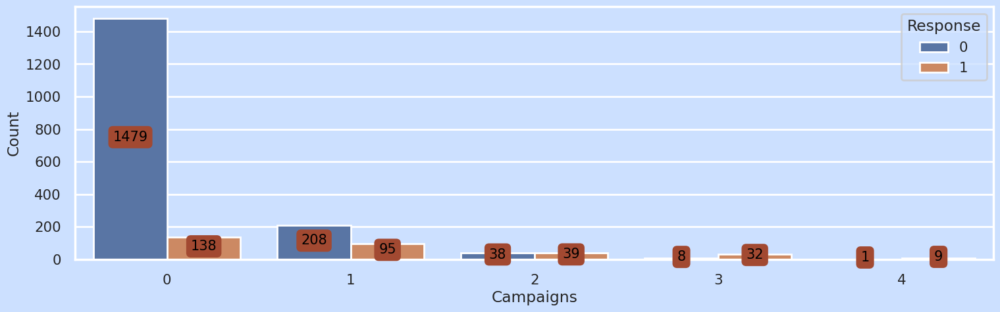

In [ ]:
plt.subplots(figsize=(18,5))

p = sns.countplot(x='Total_Accepted_Campaigns', hue='Response', data=df)
p.set_xlabel("Campaigns")
p.set_ylabel("Count")
for container in p.containers:
  p.bar_label(container, label_type="center", padding=2, color="black", rotation=0, size=15,
              bbox={"boxstyle":"round", "pad":0.2, "color":"#A24931", "edgecolor":"white", "linewidth":4, "alpha":1})

plt.show()

# Insights

In [ ]:
print("Average Rate of Response Per Customer Group via Income : ")
df.groupby([df['Income_flag'], df['Education']], observed=True)['Response'].agg(Mean_Response = 'mean',Sum_Response = 'sum').reset_index().round(2)

Average Rate of Response Per Customer Group via Income : 


,Income_flag,Education,Mean_Response,Sum_Response
0,Low Income,2n Cycle,0.11,8
1,Low Income,Basic,0.04,2
2,Low Income,Graduation,0.11,38
3,Low Income,Master,0.15,15
4,Low Income,PhD,0.16,18
5,Average Income,2n Cycle,0.04,2
6,Average Income,Graduation,0.08,25
7,Average Income,Master,0.09,11
8,Average Income,PhD,0.18,31
9,High Income,2n Cycle,0.22,12


In [ ]:
df.Marital_Status.value_counts()

,count
Marital_Status,
Married,792
Together,516
Single,447
Divorced,214
Widow,71
Alone,3
Absurd,2
YOLO,2


In [ ]:
# High Income | Well Educated | Married/Together Customers vs Campaign Response
Married_Together_Response_mask = (df['Income_flag'] == "High Income") & (df['Education'].isin(['Graduation', 'PhD', 'Master'])) & (~df['Marital_Status'].isin(['Single', 'Divorced', 'Widow']))
df[Married_Together_Response_mask][['Education', 'Marital_Status', 'Income', 'Income_flag', 'Response']]

,Education,Marital_Status,Income,Income_flag,Response
2,Graduation,Together,71613.0,High Income,0
18,Master,Married,76995.0,High Income,0
23,PhD,Married,65324.0,High Income,0
29,PhD,Married,84618.0,High Income,0
34,Master,Married,68657.0,High Income,0
...,...,...,...,...,...
2194,Graduation,Married,73803.0,High Income,1
2203,Graduation,Married,73807.0,High Income,0
2211,Graduation,Together,88325.0,High Income,0
2226,Graduation,Married,63777.0,High Income,0


In [ ]:
# High Income | Well Educated | Single/Divorced/Widow Customers vs Campaign Response
Single_Divorced_Response_mask = (df['Income_flag'] == "High Income") & (df['Education'].isin(['Graduation', 'PhD', 'Master'])) & (df['Marital_Status'].isin(['Single', 'Divorced', 'Widow']))
df[Single_Divorced_Response_mask][['Education', 'Marital_Status', 'Income', 'Income_flag', 'Response']]

,Education,Marital_Status,Income,Income_flag,Response
12,Graduation,Divorced,63033.0,High Income,0
15,PhD,Single,82800.0,High Income,1
45,Graduation,Single,79941.0,High Income,0
50,Graduation,Widow,65486.0,High Income,0
53,Graduation,Divorced,82582.0,High Income,1
...,...,...,...,...,...
2145,Graduation,Single,78499.0,High Income,1
2167,Master,Single,91172.0,High Income,1
2170,Graduation,Single,69263.0,High Income,0
2176,Master,Divorced,81380.0,High Income,0


In [ ]:
print("\n Married/Together People Average Response Rate : ", df[Married_Together_Response_mask]['Response'].mean())
print("\n Single/Divorced/Widow Average Response Rate : ", df[Single_Divorced_Response_mask]['Response'].mean())


 Married/Together People Average Response Rate :  0.17359413202933985

 Single/Divorced/Widow Average Response Rate :  0.36363636363636365


In [ ]:
Above_AVG_Income_List = ['High Income','Average Income']
Low_Income_List = ['Low Income']
High_Education_List = ['Graduation', 'PhD','Master']
Single_Status_List = ['Single', 'Divorced', 'Widow']
Married_Status_List = ['Married', 'Together']
High_Propotional_Status_List = ['Single', 'Married', 'Together', 'Divorced']

In [ ]:
lists_collection1 = [
    (Above_AVG_Income_List, High_Education_List, Single_Status_List)
]
list_collection2 = [
    (Above_AVG_Income_List, High_Education_List, Married_Status_List)
]
list_collection3 = [
    (Above_AVG_Income_List, High_Education_List, High_Propotional_Status_List)
]
list_collection4 = [
    (Low_Income_List, High_Education_List, Single_Status_List)
]
list_collection5 = [
    (Low_Income_List, High_Education_List, Married_Status_List)
]
list_collection6 = [
    (Low_Income_List, High_Education_List, High_Propotional_Status_List)
]

all_list_collection = [lists_collection1, list_collection2, list_collection3, list_collection4, list_collection5, list_collection6]
for lists_collection in all_list_collection:
  for income_list, education_list, status_list in lists_collection:
      whole_result = (
          df['Income_flag'].isin(income_list) &
          df['Education'].isin(education_list) &
          df['Marital_Status'].isin(status_list)
      )
      result = df[whole_result][['Education','Marital_Status','Income','Income_flag','Response']]
      print(f"{income_list} & {education_list} & {status_list} Average Response Rate : ",(result['Response'].mean() * 100).round(2) if not result.empty else 0)


['High Income', 'Average Income'] & ['Graduation', 'PhD', 'Master'] & ['Single', 'Divorced', 'Widow'] Average Response Rate :  25.17
['High Income', 'Average Income'] & ['Graduation', 'PhD', 'Master'] & ['Married', 'Together'] Average Response Rate :  12.81
['High Income', 'Average Income'] & ['Graduation', 'PhD', 'Master'] & ['Single', 'Married', 'Together', 'Divorced'] Average Response Rate :  16.74
['Low Income'] & ['Graduation', 'PhD', 'Master'] & ['Single', 'Divorced', 'Widow'] Average Response Rate :  19.29
['Low Income'] & ['Graduation', 'PhD', 'Master'] & ['Married', 'Together'] Average Response Rate :  8.91
['Low Income'] & ['Graduation', 'PhD', 'Master'] & ['Single', 'Married', 'Together', 'Divorced'] Average Response Rate :  12.29


In [ ]:
print("Average Rate of Response Per Customer Group : ")
df.groupby(df['Segment'])['Response'].agg(['mean','sum']).round(2)

Average Rate of Response Per Customer Group : 


,mean,sum
Segment,,
At Risk,0.05,19
Best Customers,0.44,21
Loyal Customers,0.18,76
Regular,0.16,197


In [ ]:
df.groupby([df['Segment'], df['Education']])['Response'].sum().rename("Total_Response").reset_index().style.background_gradient(cmap="viridis")

,Segment,Education,Total_Response
0,At Risk,2n Cycle,1
1,At Risk,Basic,0
2,At Risk,Graduation,8
3,At Risk,Master,4
4,At Risk,PhD,6
5,Best Customers,2n Cycle,2
6,Best Customers,Graduation,13
7,Best Customers,Master,2
8,Best Customers,PhD,4
9,Loyal Customers,2n Cycle,8



- Observation:
- In At Risk X Graduation = 8 and At Risk X Master and At Risk X PhD (well Educated Customer gives high chance of Response don't refure it, retain them)

In [ ]:
print("Education and Marital Status wise Total and Average Response Result")
df.groupby(categorical_features)['Response'].agg(['sum','mean']).reset_index().style.background_gradient(cmap="coolwarm")

Education and Marital Status wise Total and Average Response Result


,Education,Marital_Status,sum,mean
0,2n Cycle,Divorced,5,0.238095
1,2n Cycle,Married,8,0.112676
2,2n Cycle,Single,6,0.166667
3,2n Cycle,Together,3,0.056604
4,2n Cycle,Widow,0,0.000000
5,Basic,Divorced,0,0.000000
6,Basic,Married,0,0.000000
7,Basic,Single,0,0.000000
8,Basic,Together,2,0.181818
9,Basic,Widow,0,0.000000



- Observation:
- 1. 2n Cycle category people has lower response
- 2. basic category people has non reponse
- 3. Graduation X Married and Graduation X Single has very high Response
- 4. Graduation category people purchase more compare to others
- 5. Phd category people are the second higher purchaser
- 6. Master category people are has moderate product purchasing
- Mean values are affected due to some higher values (outliers)
- Married and Single people purchasing more products (Single > Married > Together)

In [ ]:
Df_with_total_accepted_campaign = df[['Education',
    'Marital_Status', 'Income', 'Recency', 'Customer_Tenure',
    'Response', 'Total_Accepted_Campaigns']]

In [ ]:
Df_with_total_accepted_campaign

,Education,Marital_Status,Income,Recency,Customer_Tenure,Response,Total_Accepted_Campaigns
0,Graduation,Single,58138.0,58,4929,1,0
1,Graduation,Single,46344.0,38,4379,0,0
2,Graduation,Together,71613.0,26,4578,0,0
3,Graduation,Together,26646.0,26,4405,0,0
4,PhD,Married,58293.0,94,4427,0,0
...,...,...,...,...,...,...,...
2232,Graduation,Single,26816.0,50,4947,0,0
2235,Graduation,Married,61223.0,46,4647,0,0
2237,Graduation,Divorced,56981.0,91,4421,0,1
2238,Master,Together,69245.0,8,4422,0,0


In [ ]:
print('Total No of Buyers which choose 3+ Campaigns: ', len(Df_with_total_accepted_campaign[Df_with_total_accepted_campaign['Total_Accepted_Campaigns'] >= 3]))

Total No of Buyers which choose 3+ Campaigns:  50


In [ ]:
Df_with_total_accepted_campaign[Df_with_total_accepted_campaign['Total_Accepted_Campaigns'] >=4].sort_values(by='Marital_Status').style.background_gradient(cmap="coolwarm", subset=['Customer_Tenure'])

,Education,Marital_Status,Income,Recency,Customer_Tenure,Response,Total_Accepted_Campaigns
252,Graduation,Divorced,102692.000000,5,4716,1,4
990,Graduation,Divorced,85683.000000,6,4366,1,4
1308,Graduation,Married,65169.000000,23,4432,1,4
1710,Graduation,Married,83512.000000,31,4278,1,4
430,PhD,Single,84865.000000,1,4682,1,4
1922,Graduation,Single,91249.000000,84,4883,1,4
2167,Master,Single,91172.000000,94,4725,1,4
417,Graduation,Together,80134.000000,11,4401,0,4
559,Graduation,Together,87771.000000,61,4669,1,4
1087,PhD,Together,84460.000000,80,4807,1,4


- Observation:
- 1. Most people are well educated and has high income that's why there are high chance of getting purchases
- 2. That's why 9 out of 10 people product purchases
- 3. Well Educated + Single Marital status persons has high income compare to others (More focus on it)....

In [ ]:
Df_with_total_accepted_campaign[Df_with_total_accepted_campaign['Total_Accepted_Campaigns'] ==3].sort_values(by='Marital_Status').style.background_gradient(cmap="coolwarm", subset=['Customer_Tenure','Response'])

,Education,Marital_Status,Income,Recency,Customer_Tenure,Response,Total_Accepted_Campaigns
2171,2n Cycle,Divorced,65706.000000,77,4632,1,3
1641,PhD,Divorced,64140.000000,71,4545,1,3
336,Graduation,Divorced,75693.000000,10,4836,1,3
1100,Graduation,Divorced,83829.000000,78,4530,1,3
734,Graduation,Divorced,89694.000000,22,4529,0,3
2168,Graduation,Married,90000.000000,91,4454,0,3
1711,Master,Married,77520.000000,30,4571,1,3
987,Graduation,Married,75759.000000,46,4513,1,3
1721,PhD,Married,92491.000000,71,4690,1,3
1749,PhD,Married,80360.000000,56,4749,0,3


- Observation:
- 1. Well Educated + Single Marital status persons has high income compare to others (More focus on it)....
- 2. 8/40 peoples non response

In [ ]:
Df_with_total_amount_purchase = df[['Education',
    'Marital_Status', 'Income', 'Recency', 'Customer_Tenure',
    'Response', 'Total_Amount_Spent']]

In [ ]:
for threshold in [100, 500, 1000, 2000, 2500]:
    df_amount_p = Df_with_total_amount_purchase
    count = len(df_amount_p[(df_amount_p['Total_Amount_Spent'] <= threshold) & (df_amount_p['Response'] == 1)])
    print(f"≤{threshold}: {count}")

≤100: 49
≤500: 116
≤1000: 153
≤2000: 289
≤2500: 311


In [ ]:
for threshold in [100, 500, 1000, 2000, 2500]:
    df_amount_p = Df_with_total_amount_purchase
    rate = len(df_amount_p[(df_amount_p['Total_Amount_Spent'] <= threshold) & (df_amount_p['Response'] == 1)]) / len(df_amount_p[df_amount_p['Total_Amount_Spent'] <= threshold])
    print(f"≤{threshold}: {rate:.4f}")

≤100: 0.0754
≤500: 0.1019
≤1000: 0.1021
≤2000: 0.1444
≤2500: 0.1522



- Observation:
- As total_amount_spent threshold increases, both the count and response rate of positive responders grow — but the most significant
- jump in response rate happens between ≤1000 (10.2%) and ≤2000 (14.4%), suggesting that customers spending between 1000-2500 are
- the most receptive to the campaign and should be the primary target segment.

- The response rate remains almost flat from ≤100 (7.6%) to ≤1000 (10.3%), but shows a significant jump at ≤2000 (14.5%) — indicating
- a clear inflection point around the 1000-2000 spending range. This suggests that customers spending below 1000 are largely unresponsive
- to the campaign, while customers spending 1000+ are the most receptive target segment, meaning marketing budget should be focused on this group rather than low spenders.

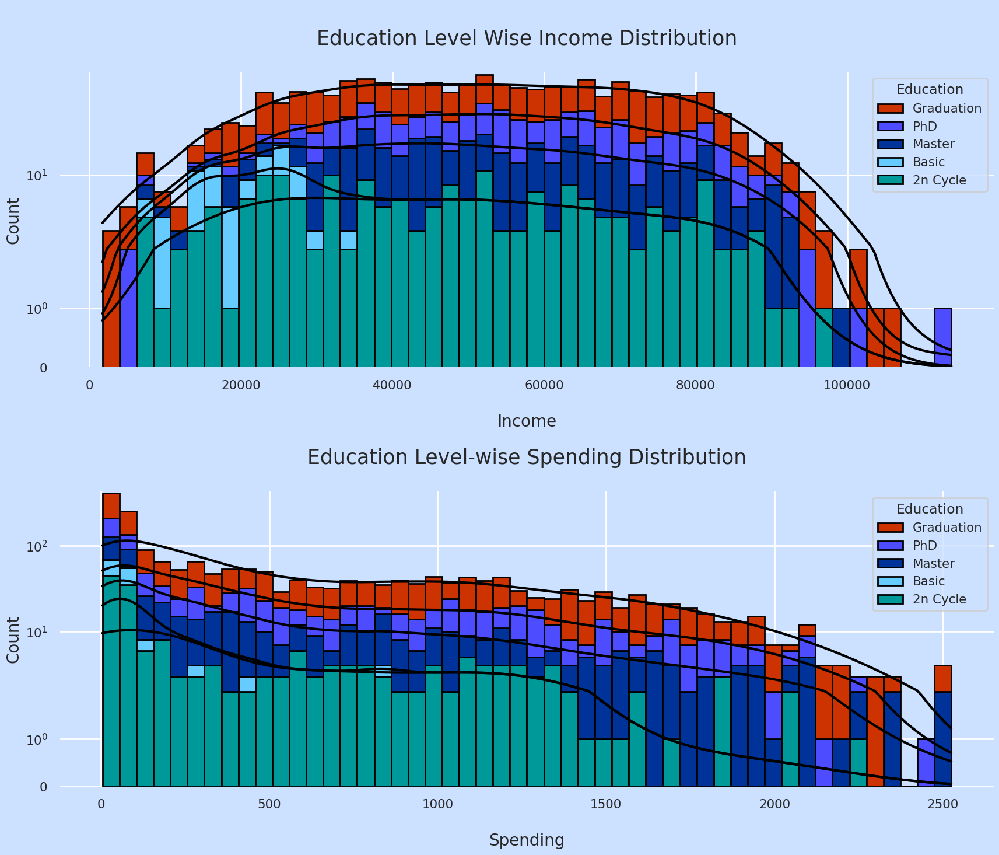

In [ ]:
_, axes = plt.subplots(2, 1, figsize=(20,16))
plt.tight_layout(pad=7.0)

colors2 = ["#cc3300","#4d4dff","#003399","#66ccff","#009999"]
sns.histplot(x='Income', hue='Education', multiple="stack", palette=colors2, ax=axes[0], kde=True, bins=50, alpha=1, fill=True, edgecolor="black", data=df)
axes[0].lines[0].set_color("000000")
axes[0].lines[1].set_color("000000")
axes[0].lines[2].set_color("000000")
axes[0].lines[3].set_color("000000")
axes[0].lines[4].set_color("000000")

axes[0].set_yscale("symlog")
axes[0].set_title("\nEducation Level Wise Income Distribution\n", fontsize=25)
axes[0].set_ylabel("Count",fontsize=20)
axes[0].set_xlabel("\nIncome",fontsize=20)

sns.histplot(x='Total_Amount_Spent', hue='Education', multiple='stack', palette=colors2, ax=axes[1], kde=True, fill=True, bins=50, alpha=1, edgecolor='black', data=df)
axes[1].lines[0].set_color("000000")
axes[1].lines[1].set_color("000000")
axes[1].lines[2].set_color("000000")
axes[1].lines[3].set_color("000000")
axes[1].lines[4].set_color("000000")

axes[1].set_yscale("symlog")
axes[1].set_title("\nEducation Level-wise Spending Income Distribution\n",fontsize=25)
axes[1].set_ylabel("Count",fontsize=20)
axes[1].set_xlabel("\nSpending",fontsize=20)

sns.despine(left=True, bottom=True)
plt.show()

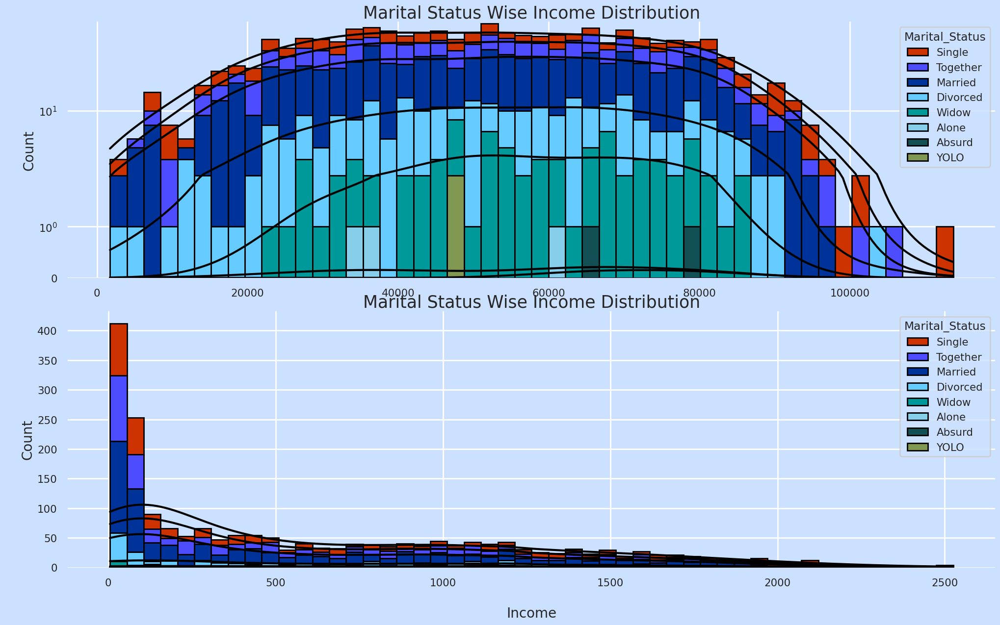

In [ ]:
_, axes = plt.subplots(2,1, figsize=(20,12))

plt.tight_layout(pad=0.8)

colors2 = ["#cc3300","#4d4dff","#003399","#66ccff","#009999","#87CEEB","#125055","#819853"]
sns.histplot(x="Income", hue="Marital_Status", multiple='stack', palette=colors2, fill=True, kde=True,alpha=1, ax=axes[0], bins=50, edgecolor='black', data=df)
for line in axes[0].lines:
  line.set_color("black")


axes[0].set_yscale("symlog")
axes[0].set_title("Marital Status Wise Income Distribution", fontsize=25)
axes[0].set_xlabel("\nIncome", fontsize=20)
axes[0].set_ylabel("\nCount", fontsize=20)

sns.histplot(x="Total_Amount_Spent", hue="Marital_Status", multiple='stack', palette=colors2, ax=axes[1], kde=True, fill=True, alpha=1, bins=50, edgecolor='black',data=df)
for line in axes[1].lines:
  line.set_color("black")

axes[1].set_yscale("linear")
axes[1].set_title("Marital Status Wise Spending Income Distribution", fontsize=25)
axes[1].set_xlabel("\nIncome", fontsize=20)
axes[1].set_ylabel("\nCount", fontsize=20)

sns.despine(left=True, bottom=True)
plt.show()

# Data Cleaning

#### Check Null Values

In [ ]:
df = backup_df.copy()

In [ ]:
##these are the features with nan value
features_with_na=[features for features in df.columns if df[features].isnull().sum()>=1]
for feature in features_with_na:
    print(feature,np.round(df[feature].isnull().mean()*100,5), '% missing values')

Income 1.07143 % missing values


In [ ]:
# statistics on numerical columns (Null cols)
df[features_with_na].select_dtypes(exclude='object').describe()

,Income
count,2216.000000
mean,52247.251354
std,25173.076661
min,1730.000000
25%,35303.000000
50%,51381.500000
75%,68522.000000
max,666666.000000


In [ ]:
#Age
df.Income.fillna(df.Income.median(), inplace=True)

### Imputing Null values

### 3.2 Other Data Cleaning steps

**Handling Duplicates**

In [ ]:
df.duplicated().sum()

np.int64(0)

**Remove ```Z_CostContact``` and ```Z_Revenue``` columns from the dataset as contains only constant value, therefore doesn't create any variance in the dataset.**


In [ ]:
columns_to_drop = ['ID', 'Z_CostContact','Z_Revenue']
for column in columns_to_drop:
    df.drop(column, inplace=True, axis=1)
    print(f"Column {column} is dropped.")

Column ID is dropped.
Column Z_CostContact is dropped.
Column Z_Revenue is dropped.


# Feature Engineering

## Feature Extraction
- We will extract and create some of the meaningfull features.

In [ ]:
# create new column for feature

from datetime import datetime


df = df.copy()

##  creating a new field to store the Age of the customer
df['Age']=2022-df['Year_Birth']

###  recoding the customer's education level to numeric form (0: high-school, 1: diploma, 2: bachelors, 3: masters, and 4: doctorates)
df["Education"].replace({"Basic":0,"2n Cycle":1, "Graduation":2, "Master":3, "PhD":4},inplace=True)

#  recoding the customer's marital status to numeric form (0: not living with a partner, 1: living with a partner)
df['Marital_Status'].replace({"Married":1, "Together":1, "Absurd":0, "Widow":0, "YOLO":0, "Divorced":0, "Single":0,"Alone":0},inplace=True)

#  creating a new field to store the number of children in the household
df['Children']=df['Kidhome']+df['Teenhome']

#creating Family_Size
df['Family_Size']=df['Marital_Status']+df['Children']+1



#  creating a new field to store the total spending of the customer
df['Total_Spending']=df["MntWines"]+ df["MntFruits"]+ df["MntMeatProducts"]+ df["MntFishProducts"]+ df["MntSweetProducts"]+ df["MntGoldProds"]
df["Total Promo"] =  df["AcceptedCmp1"]+ df["AcceptedCmp2"]+ df["AcceptedCmp3"]+ df["AcceptedCmp4"]+ df["AcceptedCmp5"]

## The following code works out how long the customer has been with the company and store the total number of promotions the customers responded to
df['Dt_Customer']=pd.to_datetime(df['Dt_Customer'], format="%d-%m-%Y")
today=datetime.today()
df['Days_as_Customer']=(today-df['Dt_Customer']).dt.days
df['Offers_Responded_To']=df['AcceptedCmp1']+df['AcceptedCmp2']+df['AcceptedCmp3']+df['AcceptedCmp4']+df['AcceptedCmp5']+df['Response']
df["Parental Status"] = np.where(df["Children"] > 0, 1, 0)






#dropping columns which are already used to create new features
columns_to_drop = ['Year_Birth','Kidhome','Teenhome']
df.drop(columns = columns_to_drop, axis = 1, inplace=True)
df.rename(columns={"Marital_Status": "Marital Status","MntWines": "Wines","MntFruits":"Fruits",
                   "MntMeatProducts":"Meat","MntFishProducts":"Fish","MntSweetProducts":"Sweets",
                   "MntGoldProds":"Gold","NumWebPurchases": "Web","NumCatalogPurchases":"Catalog",
                   "NumStorePurchases":"Store","NumDealsPurchases":"Discount Purchases"},
          inplace = True)

corr_drift_check_df = df[["Dt_Customer","Age","Education","Marital Status","Parental Status","Children","Income","Total_Spending","Days_as_Customer","Recency","Wines","Fruits","Meat","Fish","Sweets","Gold","Web","Catalog","Store","Discount Purchases","Total Promo","NumWebVisitsMonth","Response"]]
df = df[["Age","Education","Marital Status","Parental Status","Children","Income","Total_Spending","Days_as_Customer","Recency","Wines","Fruits","Meat","Fish","Sweets","Gold","Web","Catalog","Store","Discount Purchases","Total Promo","NumWebVisitsMonth"]]

### Type of Features

**Numeric Features**

In [ ]:
num_features = [feature for feature in df.columns if df[feature].dtype != 'O']
print('Num of Numerical Features :', len(num_features))

Num of Numerical Features : 21


**Categorical Features**

In [ ]:
cat_features = [feature for feature in df.columns if df[feature].dtype == 'O']
print('Num of Categorical Features :', len(cat_features))

Num of Categorical Features : 0


**Discrete Features**

In [ ]:
discrete_features=[feature for feature in num_features if len(df[feature].unique())<=25]
print('Num of Discrete Features :',len(discrete_features))

Num of Discrete Features : 10


**Continues Features**

In [ ]:
continuous_features=[feature for feature in num_features if feature not in discrete_features]
print('Num of Continuous Features :',len(continuous_features))

Num of Continuous Features : 11


# VIF

####VIF determines the strength of the correlation between the independent variables. It is predicted by taking a variable and regressing it against every other variable “

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

contin_features = continuous_features.copy()
contin_features.remove('Total_Spending')
vif = pd.DataFrame()
X = df[contin_features]
X['intercept'] = 1

vif['Variable'] = X.columns
vif['Vif'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif = vif[vif['Variable']!='intercept']

In [ ]:
vif

,Variable,Vif
0,Age,1.050835
1,Income,1.881668
2,Days_as_Customer,1.070326
3,Recency,1.003217
4,Wines,1.846539
5,Fruits,1.892709
6,Meat,2.168103
7,Fish,2.009455
8,Sweets,1.819657
9,Gold,1.364306


#### Most research papers consider a VIF (Variance Inflation Factor) > 10 as an indicator of multicollinearity, but some choose a more conservative threshold of 5.
As we can see the Vif for the columns are less than 5, we can safely assume that the data has not such correlations.

In [ ]:
continuous_features

['Age',
 'Income',
 'Total_Spending',
 'Days_as_Customer',
 'Recency',
 'Wines',
 'Fruits',
 'Meat',
 'Fish',
 'Sweets',
 'Gold']

# Correlation Drift Check

In [ ]:
corr_with_response_by_year = pd.DataFrame({
    year: corr_drift_check_df[corr_drift_check_df['Dt_Customer'].dt.year == year].corr()['Response'].round(2)
    for year in corr_drift_check_df['Dt_Customer'].dt.year.unique()
}).T

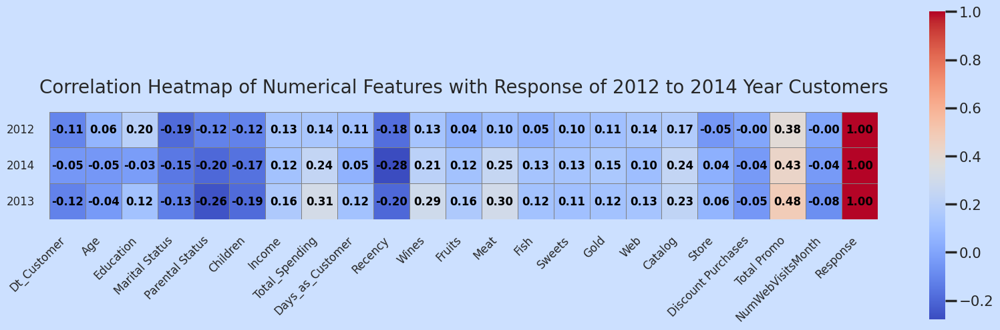

In [ ]:
plt.subplots(figsize=(20,6))


sns.heatmap(
    corr_with_response_by_year,
    annot=True,
    fmt=".2f",        # round to 2 decimals
    cmap="coolwarm",
    cbar=True,
    linewidths=0.5,
    linecolor='gray',
    annot_kws={"size":12, "weight":"bold", "color":"black"},
    square=True
)

plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(rotation=0, fontsize=12)
plt.title("Correlation Heatmap of Numerical Features with Response of 2012 to 2014 Year Customers", fontsize=20, pad=20)
plt.show()

# Outliers Detection

Text(0.5, 1.1, 'Boxplot Of Continuous Features')

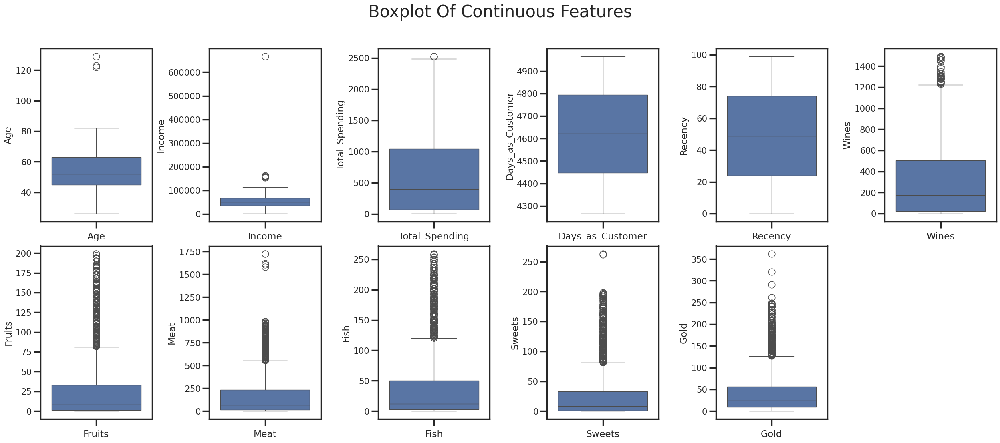

In [ ]:
cont_features = continuous_features.copy()
plt.figure(figsize=(25, 10))

for i in range(len(cont_features)):
        plt.subplot(2,6,i+1)
        sns.set_style('ticks')
        plt.xlabel(cont_features[i])
        ax = sns.boxplot(df[cont_features[i]])

plt.tight_layout(pad=0.5)
plt.suptitle("Boxplot Of Continuous Features", y=1.1,fontsize=30)

**Observation**
- We can see, there are no such outliers in ```Recency``` and ```Days_as_Customer``` Column
- But there are outliers in following columns -
    - Income
    - Wines
    - Fruits
    - Meat
    - Fish
    - Sweets
    - Gold
    - Age
    - Total Spending

**Detecting Outlier and Capping it**

In [ ]:
def detect_outliers(col):
    # Finding the IQR
    percentile25 = df[col].quantile(0.25)
    percentile75 = df[col].quantile(0.75)
    print('\n ####', col , '####')
    print("percentile25",percentile25)
    print("percentile75",percentile75)
    iqr = percentile75 - percentile25
    upper_limit = percentile75 + 1.5 * iqr
    lower_limit = percentile25 - 1.5 * iqr
    print("Upper limit",upper_limit)
    print("Lower limit",lower_limit)
    df.loc[(df[col]>upper_limit), col]= upper_limit
    df.loc[(df[col]<lower_limit), col]= lower_limit
    return df

In [ ]:
for col in continuous_features:
         detect_outliers(col)


 #### Age ####
percentile25 45.0
percentile75 63.0
Upper limit 90.0
Lower limit 18.0

 #### Income ####
percentile25 35538.75
percentile75 68289.75
Upper limit 117416.25
Lower limit -13587.75

 #### Total_Spending ####
percentile25 68.75
percentile75 1045.5
Upper limit 2510.625
Lower limit -1396.375

 #### Days_as_Customer ####
percentile25 4446.75
percentile75 4795.0
Upper limit 5317.375
Lower limit 3924.375

 #### Recency ####
percentile25 24.0
percentile75 74.0
Upper limit 149.0
Lower limit -51.0

 #### Wines ####
percentile25 23.75
percentile75 504.25
Upper limit 1225.0
Lower limit -697.0

 #### Fruits ####
percentile25 1.0
percentile75 33.0
Upper limit 81.0
Lower limit -47.0

 #### Meat ####
percentile25 16.0
percentile75 232.0
Upper limit 556.0
Lower limit -308.0

 #### Fish ####
percentile25 3.0
percentile75 50.0
Upper limit 120.5
Lower limit -67.5

 #### Sweets ####
percentile25 1.0
percentile75 33.0
Upper limit 81.0
Lower limit -47.0

 #### Gold ####
percentile25 9.0
percenti

**Checking Skewness after Outlier Capping**

In [ ]:
df[continuous_features].skew(axis=0, skipna=True)

,0
Age,0.120199
Income,0.090027
Total_Spending,0.860245
Days_as_Customer,-0.015216
Recency,-0.001987
Wines,1.096611
Fruits,1.233953
Meat,1.213585
Fish,1.230822
Sweets,1.213346


## Feature Transformation

In [ ]:
numeric_features = [feature for feature in df.columns if df[feature].dtype != 'O']
outlier_features = ["Wines","Fruits","Meat","Fish","Sweets","Gold","Age","Total_Spending"] #we can find the columns which has outliers in the EDA
numeric_features = [x for x in numeric_features if x not in outlier_features]

In [ ]:
from sklearn.preprocessing import StandardScaler, PowerTransformer
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline

dataC = df.copy()

numeric_pipeline = Pipeline(steps=
                            [("Imputer" , SimpleImputer(strategy="constant", fill_value=0)),
                             ("StandardScaler" , StandardScaler())])

outlier_features_pipeline = Pipeline(steps=
                                     [("Imputer" , SimpleImputer(strategy="constant", fill_value=0)),
                                      ("Transformers" , PowerTransformer(standardize=True))])

preprocessor = ColumnTransformer(
    [
        ("numeric_pipeline", numeric_pipeline, numeric_features),
        ("outlier_feature_pipeline", outlier_features_pipeline, outlier_features)
    ]
)

columns = dataC.columns
dataC = preprocessor.fit_transform(dataC)
scaled_data = pd.DataFrame(dataC, columns=columns)
print("After scaling, let's have a glimpse of the scaled dataset :")
scaled_data.head()

After scaling, let's have a glimpse of the scaled dataset :


,Age,Education,Marital Status,Parental Status,Children,Income,Total_Spending,Days_as_Customer,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,Web,Catalog,Store,Discount Purchases,Total Promo,NumWebVisitsMonth
0,-0.458383,-1.346874,-1.584605,-1.264505,0.299651,1.531185,0.307039,1.409304,2.510890,-0.550785,0.349414,-0.439037,0.693904,1.062784,1.487681,1.504406,1.493989,1.474200,1.196801,1.005341,1.315365
1,-0.458383,-1.346874,0.631072,1.396361,-0.263808,-1.190545,-0.383664,-1.110409,-0.568720,-1.166125,-0.168236,-0.439037,-0.130463,-1.211545,-1.001121,-1.376502,-0.889143,-0.987648,-0.967034,1.239521,-1.441417
2,-0.458383,0.742460,-1.584605,-1.264505,0.943420,-0.205773,-0.798086,1.409304,-0.226541,1.295237,-0.685887,-0.439037,-0.542647,0.748918,1.145877,0.456428,1.435812,0.579704,0.473642,0.361223,0.661170
3,-0.458383,0.742460,0.631072,0.065928,-1.204881,-1.061881,-0.798086,-0.750450,-0.910898,-0.550785,-0.168236,-0.439037,0.281720,-1.211545,-0.403311,-0.722233,-0.110828,-0.542753,-1.069040,-1.315014,-1.117211
4,1.533425,0.742460,0.631072,0.065928,0.307056,-0.953012,1.550305,0.329427,0.115638,0.064556,1.384715,-0.439037,-0.130463,0.123712,1.058075,0.406278,0.832291,0.741799,-0.368949,-1.033428,0.179322


# Model Building ( Clustering )


Create a function for Silhouette score plot

In [ ]:
from sklearn.metrics import silhouette_score, silhouette_samples
from matplotlib import cm

def silhouette_plot(model, n_cluster_range, X_clustering, pca, **kwargs):
  for n_clusters in n_cluster_range:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1,2)
    fig.set_size_inches(18,7)

    # 1st plot is silhoutte plot
    # Generally the silhoutte coefficients are between -1 to 1 but in this case we take - 0.1 to 1
    ax1.set_xlim([-0.1, 1])

    # The (n_clusters+1)*10 is for inserting blank space between silhoutte
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X_clustering) + (n_clusters) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = model(n_clusters, **kwargs)
    cluster_labels = clusterer.fit_predict(X_clustering)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X_clustering, cluster_labels)
    print(
      "For n_clusters =",
      n_clusters,
      "The average silhouette_score is :",
      silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X_clustering, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
      # Aggregate the silhouette scores for samples belonging to
      # cluster i, and sort them
      ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

      ith_cluster_silhouette_values.sort()

      size_cluster_i = ith_cluster_silhouette_values.shape[0]
      y_upper = y_lower + size_cluster_i

      color = cm.nipy_spectral(float(i)/ n_clusters)
      ax1.fill_betweenx(
          np.arange(y_lower, y_upper),
          0,
          ith_cluster_silhouette_values,
          facecolor=color,
          edgecolor=color,
          alpha=0.7,
      )

      # Label the silhouette plots with their cluster numbers at the middle
      ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

      # Compute the new y_lower for next plot
      y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

     # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.2,-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    # colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)

    sns.scatterplot(
        x=pca[:, 0],
        y=pca[:, 1],
        hue=cluster_labels,
        palette=sns.color_palette("colorblind", len(set(cluster_labels))),
        alpha=0.7,
        legend="full",
        ax=ax2
    )
    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
      f"Silhouette analysis for {model.__name__} clustering on sample data with n_clusters = %d"
      % n_clusters,
      fontsize=14,
      fontweight="bold",
    )

plt.show()

# PCA (Principal Component Analysis)

In [ ]:
from sklearn.decomposition import PCA
df_scaled = scaled_data.copy()

var_ratio = {}

for n in range(2,18):
  pc=PCA(n_components=n)
  df_pca=pc.fit(df_scaled)
  var_ratio[n]=sum(df_pca.explained_variance_ratio_)

Choosing PCA` n_components` and Kmeans `n_clusters` based on Clustering metrics

In [ ]:
# apply PCA and display clustering metrics

from sklearn.cluster import KMeans

for y in range(2,8):
  print("PCA with # of Components : ", y)
  pca_p = PCA(n_components=y)
  data_p = pca_p.fit_transform(df_scaled)

  for x in range(2,7):
    k_means_model = KMeans(n_clusters=x)
    labels = k_means_model.fit_predict(data_p)
    silhouette_scores = silhouette_score(data_p, labels)

    print('Silhouette-Score for', x,  'Clusters: ', silhouette_scores , '-  Inertia: ',k_means_model.inertia_)
  print()

PCA with # of Components :  2
Silhouette-Score for 2 Clusters:  0.5284478843842312 -  Inertia:  9059.679273589147
Silhouette-Score for 3 Clusters:  0.5103338818335074 -  Inertia:  5130.323219038544
Silhouette-Score for 4 Clusters:  0.45366506095399484 -  Inertia:  3978.664695254692
Silhouette-Score for 5 Clusters:  0.44891268589931993 -  Inertia:  3304.293601881969
Silhouette-Score for 6 Clusters:  0.39553017638971627 -  Inertia:  2835.204117797916

PCA with # of Components :  3
Silhouette-Score for 2 Clusters:  0.454530700327864 -  Inertia:  12743.393939427162
Silhouette-Score for 3 Clusters:  0.40639822878400955 -  Inertia:  8794.957847106156
Silhouette-Score for 4 Clusters:  0.34193933376245716 -  Inertia:  7600.434782367327
Silhouette-Score for 5 Clusters:  0.31585166020295435 -  Inertia:  6299.706784677689
Silhouette-Score for 6 Clusters:  0.3154640626936712 -  Inertia:  5710.040691600066

PCA with # of Components :  4
Silhouette-Score for 2 Clusters:  0.41743241137500986 -  Inert

**Observation**
* **We can go with PCA with 2 components.**
* **We can go with Kmeans Clusters in the range of 4-6 as it has Good score with lesser Inertia compared to others**

In [ ]:
# Reducing the dimensions of data

pca_final = PCA(n_components=2, random_state=32).fit(df_scaled)

reduced = pca_final.fit_transform(df_scaled)
pcadf = pd.DataFrame(reduced)
pcadf.columns = ['PC1', 'PC2']

pcadf.head(10)

,PC1,PC2
0,4.130751,0.501059
1,-3.495848,-0.524323
2,3.032352,-0.850799
3,-2.794852,-1.108400
4,0.786683,0.794184
5,1.105611,0.968065
6,1.539503,1.352260
7,-1.842628,0.488612
8,-3.457028,-0.155012
9,-5.229958,1.478703


The explained variance ratio is the percentage of variance that is attributed by each of the selected components.

In [ ]:
pca_final.explained_variance_ratio_

array([0.39488178, 0.10833485])

# KMeans Clustering

Elbow Method to find best Clusters for K-Means

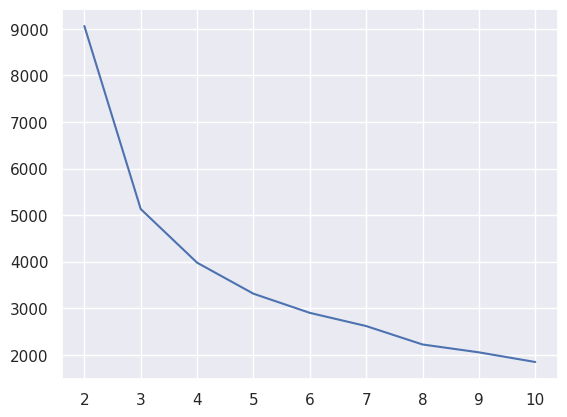

In [ ]:
wcss = {}
sns.set()
for i in range(2,11):
  kmeans_model = KMeans(n_clusters=i)
  kmeans_model.fit(pcadf)
  wcss[i] = kmeans_model.inertia_

plt.plot(range(2,11), wcss.values())
plt.show()

- Here the optimum number of cluster is 3 cluster since it is the place where the graph start to flatten out meaning that having higher number of cluster will not yield a much more fitting machine.

**Reports:**

* We will use **k = 3**, thus there will be **three clusters** in our dataset.
* We will use **KMeans Algorithm** for clustering.

Silhoutte Score Plot for K-Means to choose best number of clusters

For n_clusters = 3 The average silhouette_score is : 0.5104276777223485
For n_clusters = 4 The average silhouette_score is : 0.45277333714627405
For n_clusters = 5 The average silhouette_score is : 0.4288326945429007
For n_clusters = 6 The average silhouette_score is : 0.3963283028431145


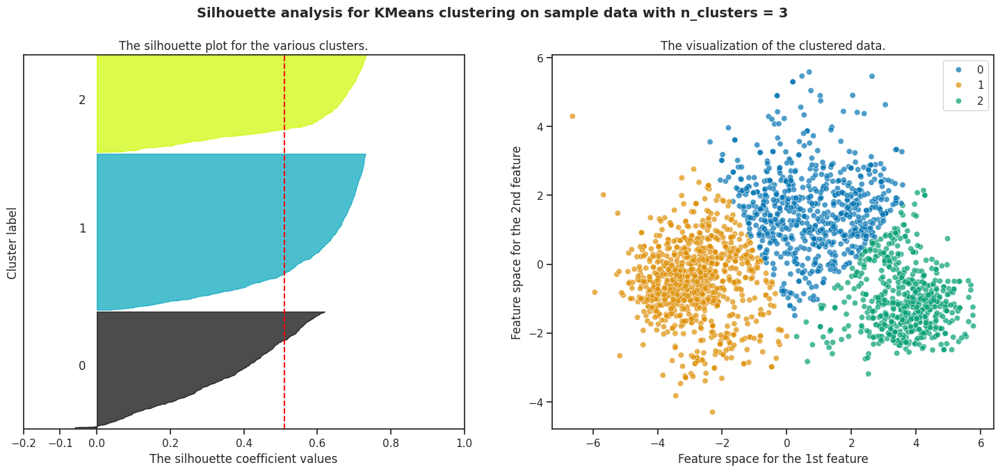

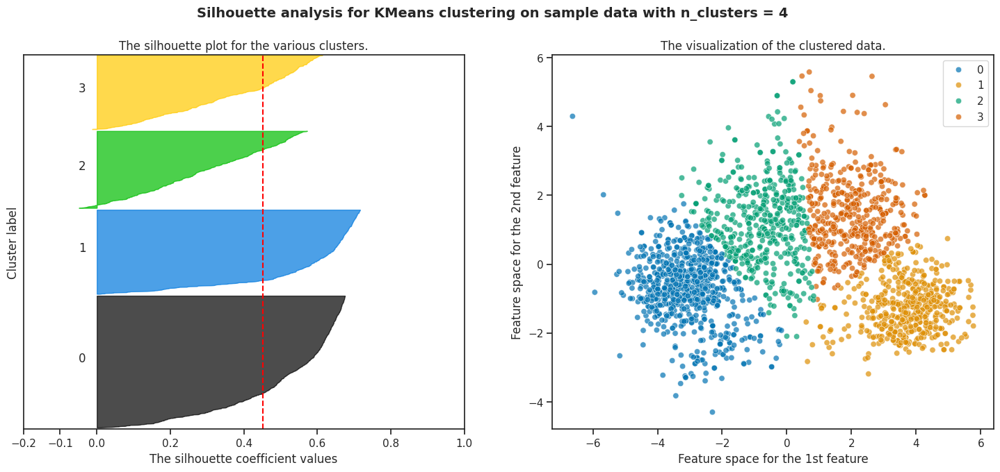

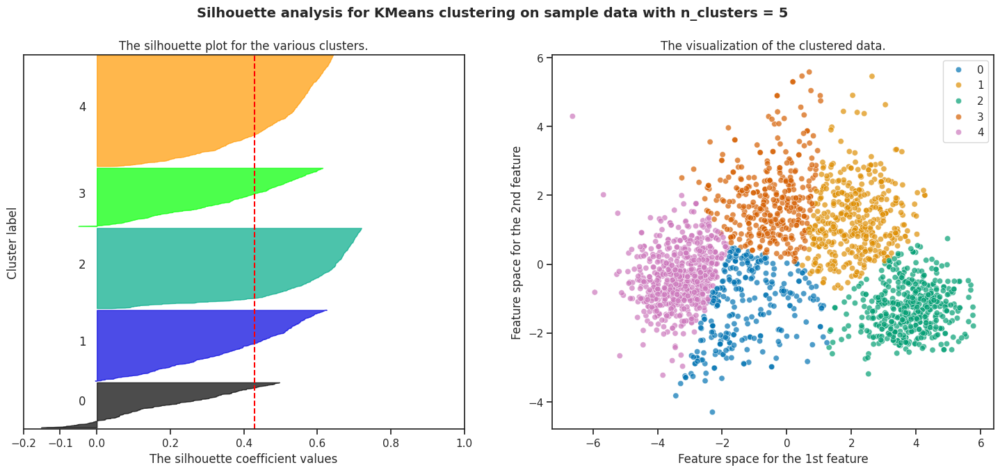

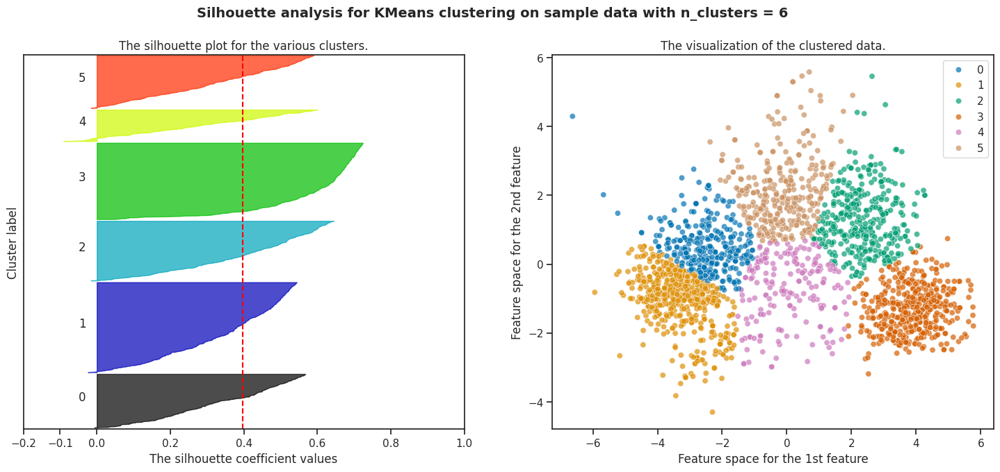

In [ ]:
# We plot silhoutte score for Kmeans
# Here pcadf is pca dataframe, and Reduced is array of data after PCA.

sns.set_style('ticks')
silhouette_plot(KMeans, range(3,7), pcadf, reduced)

#### For n_clusters = 3 The average silhouette_score is : 0.51
#### For n_clusters = 4 The average silhouette_score is : 0.45
#### For n_clusters = 5 The average silhouette_score is : 0.45
#### For n_clusters = 6 The average silhouette_score is : 0.41

**Conclusions**
* Clusters of 3 has good balance of Inertia and Shilloute score, we can go with with 3 clusters.


Apply Kmeans Clustering with 3 clusters

In [ ]:
# Fitting the model to reduced data
model = KMeans(n_clusters=3).fit(pcadf)
model_label = model.labels_
model_centers = model.cluster_centers_

Text(0, 0.5, 'pca2')

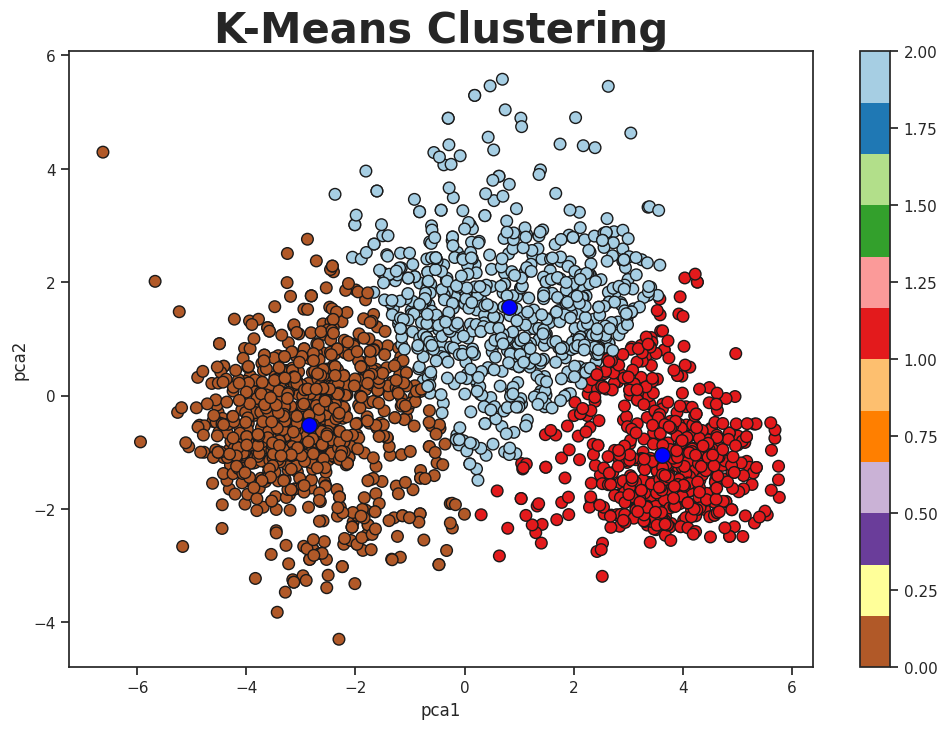

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(pcadf['PC1'], pcadf['PC2'], c=model_label, s=70, cmap="Paired_r", ec="k")
plt.colorbar(scatter)
plt.scatter(model_centers[:,0], model_centers[:,1], c="blue", ec="k", s=500, marker=".")

plt.title('K-Means Clustering', weight='bold', size=30)
plt.xlabel('pca1')
plt.ylabel('pca2')

# Agglomertive Clustering

Silhoutte Score Plot for Agglomerative Clustering to choose best number of clusters
- We will go with the n_clusters range of 2-7 to find the best cluster for Agglomerative clustering

For n_clusters = 2 The average silhouette_score is : 0.4812347065595146
For n_clusters = 3 The average silhouette_score is : 0.4731726612943388
For n_clusters = 4 The average silhouette_score is : 0.43908681362926916
For n_clusters = 5 The average silhouette_score is : 0.4165290795339583
For n_clusters = 6 The average silhouette_score is : 0.3936313189535937
For n_clusters = 7 The average silhouette_score is : 0.38969562707339145


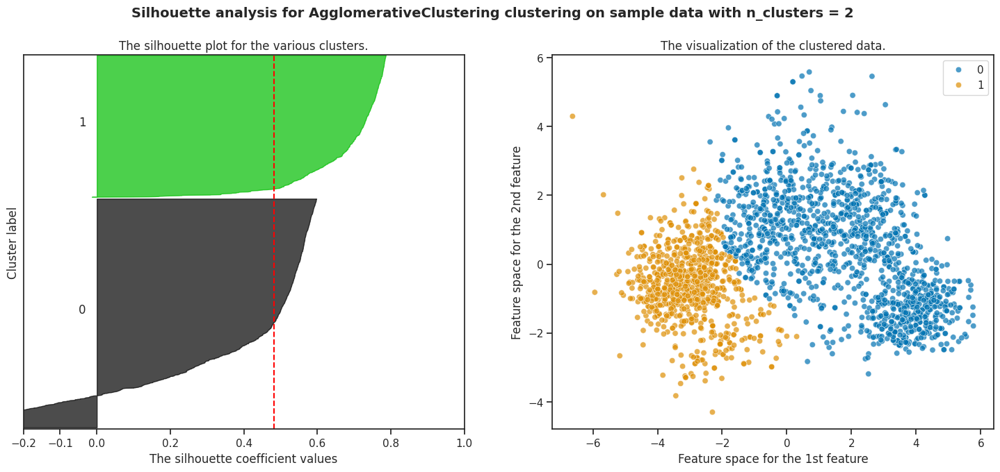

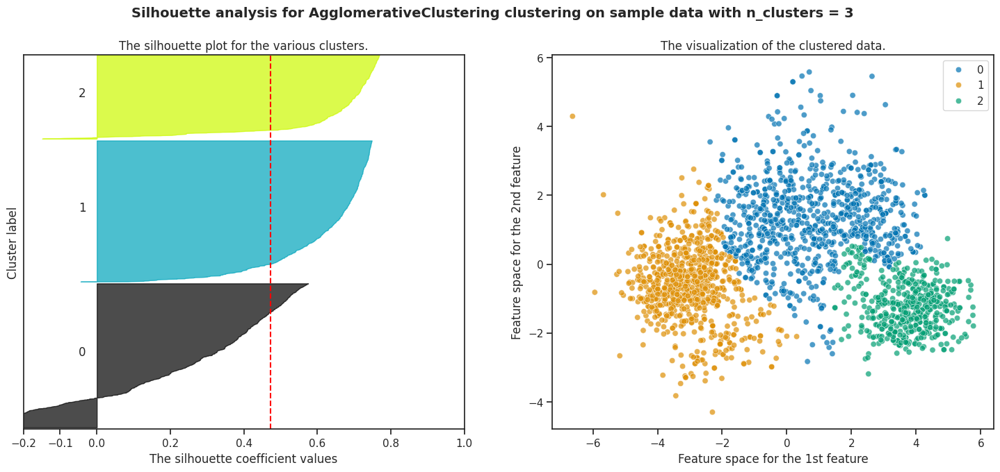

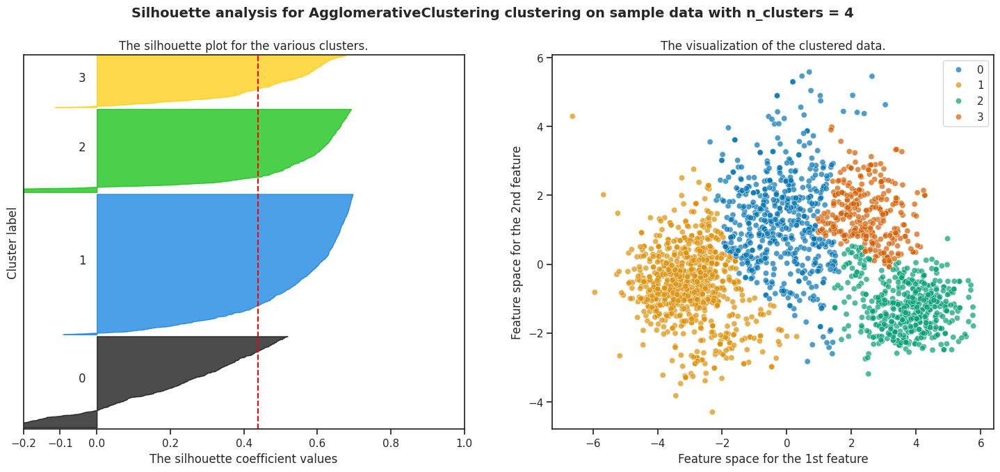

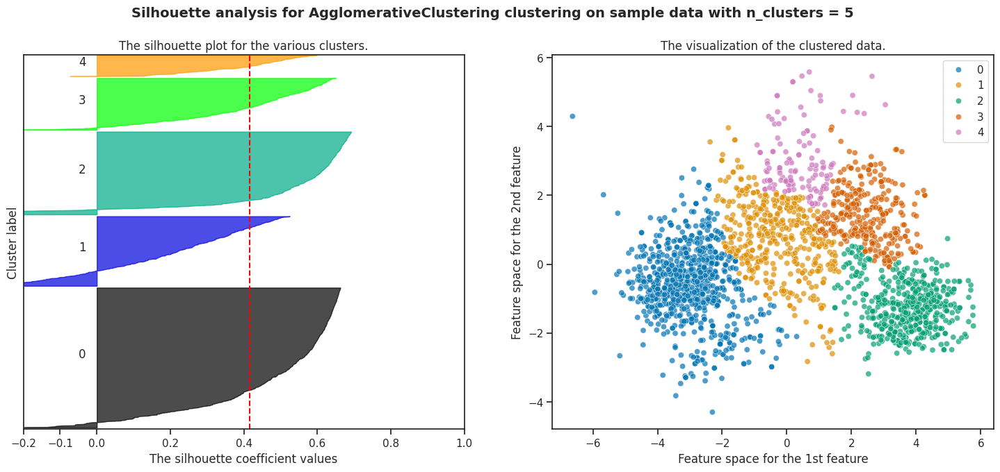

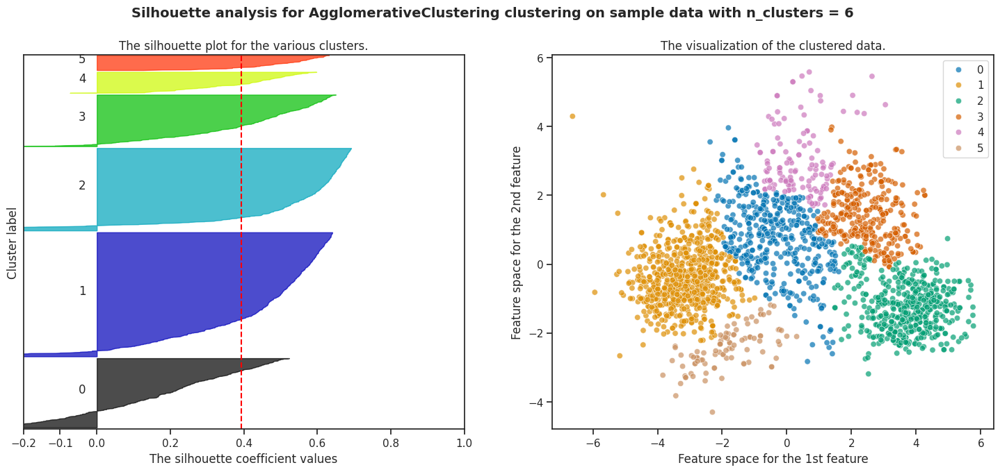

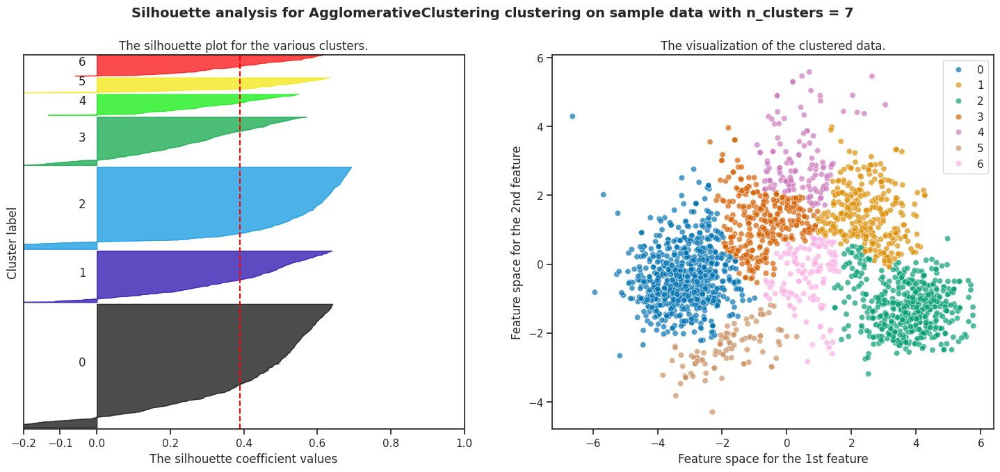

In [ ]:
from sklearn.cluster import AgglomerativeClustering

silhouette_plot(AgglomerativeClustering, range(2,8),pcadf,reduced)

#### Visualization of Agglomerative Clustering

best average silhouette_score is : 0.48

For n_clusters = 2 The average silhouette_score is : 0.48
For n_clusters = 3 The average silhouette_score is : 0.47
For n_clusters = 4 The average silhouette_score is : 0.44
For n_clusters = 5 The average silhouette_score is : 0.42
For n_clusters = 6 The average silhouette_score is : 0.39
For n_clusters = 7 The average silhouette_score is : 0.39

**Conclusions**
* Clusters of 2 has good balance of Inertia and Shilloute score, we can go with with 3 clusters.


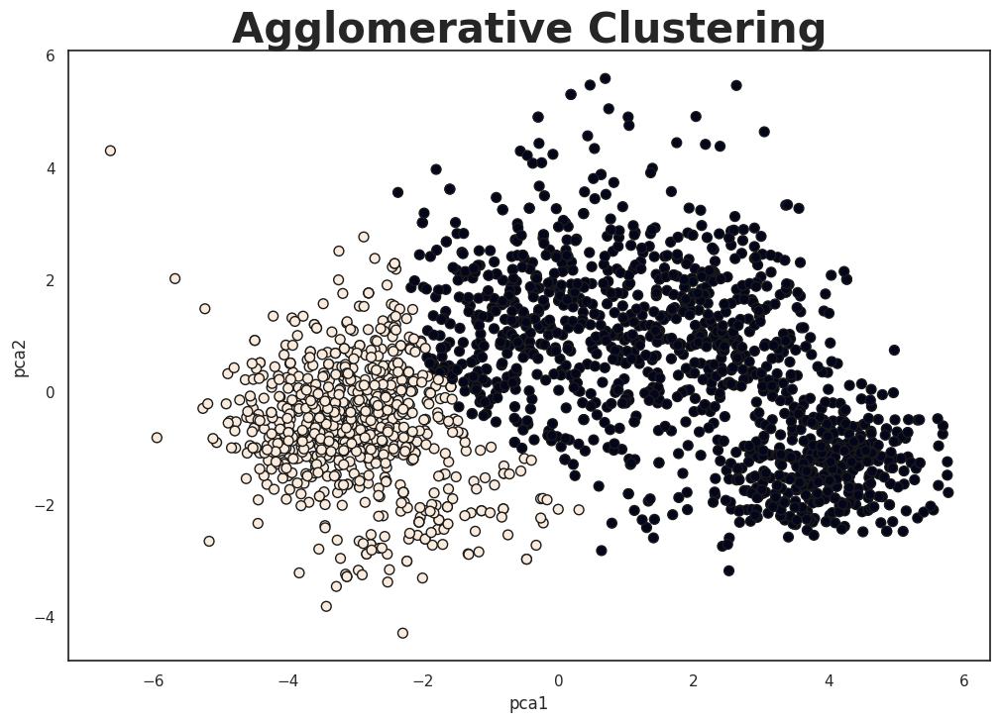

In [ ]:
agglomerative_model = AgglomerativeClustering(n_clusters=2, metric="euclidean", linkage="ward").fit(pcadf)
model_label = agglomerative_model.labels_
plt.figure(figsize=(12,8))

sns.set_style('white')
plt.title('Agglomerative Clustering', weight='bold', size=30)
plt.xlabel('pca1')
plt.ylabel('pca2')
plt.scatter(pcadf['PC1'], pcadf['PC2'], c=model_label, s=50,ec="k")
plt.show()

**Report**
* Agglomerative clustering performed well than K means clustering.
* The best Silhoutte score is 0.48, were as K means had 0.44 Silhoutte score.

# Gaussian Mixture

For n_clusters = 3 The average silhouette_score is : 0.4768299384683514
For n_clusters = 4 The average silhouette_score is : 0.4453698869435128
For n_clusters = 5 The average silhouette_score is : 0.44762797111514885
For n_clusters = 6 The average silhouette_score is : 0.39911778113653035
For n_clusters = 7 The average silhouette_score is : 0.3969435674082488


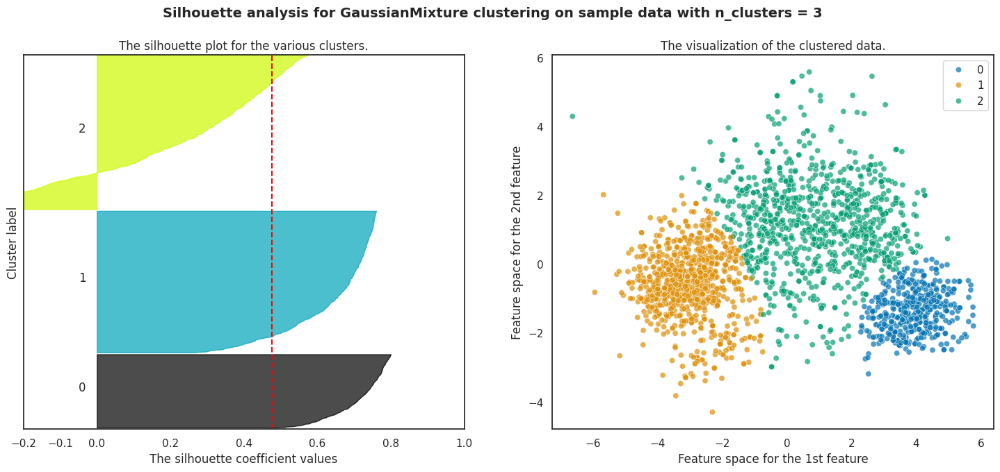

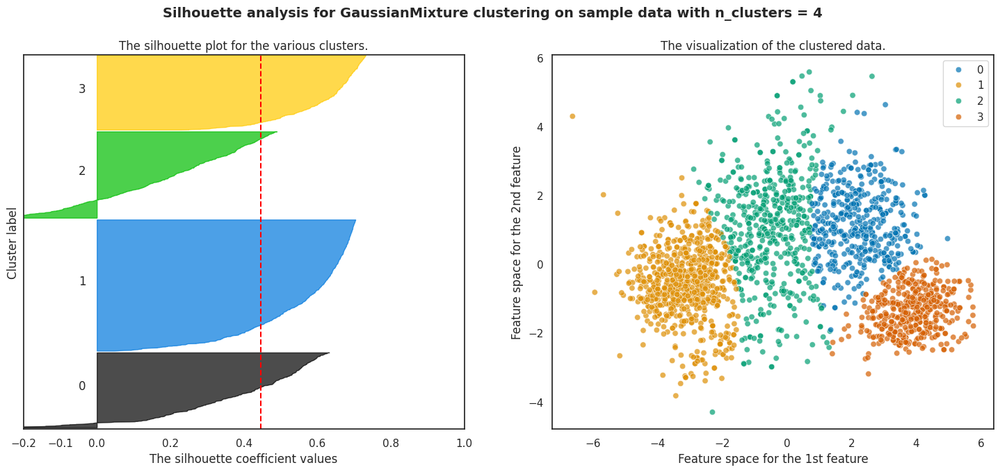

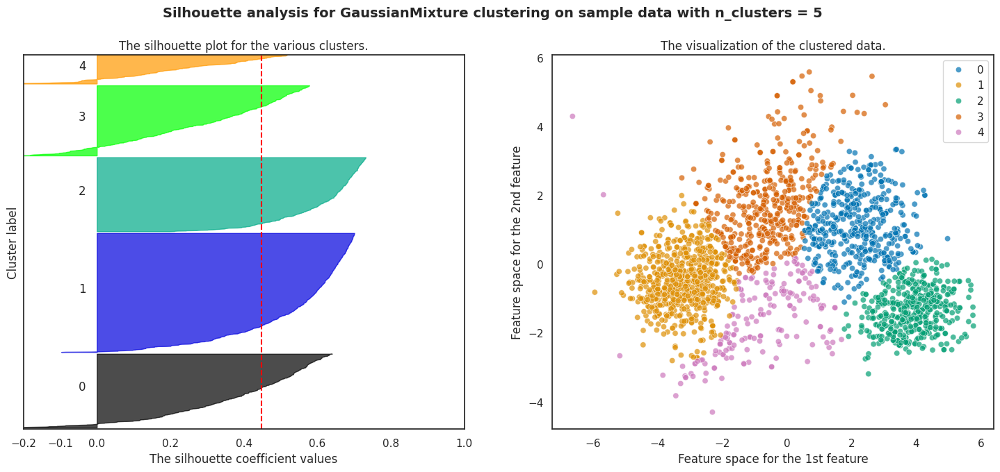

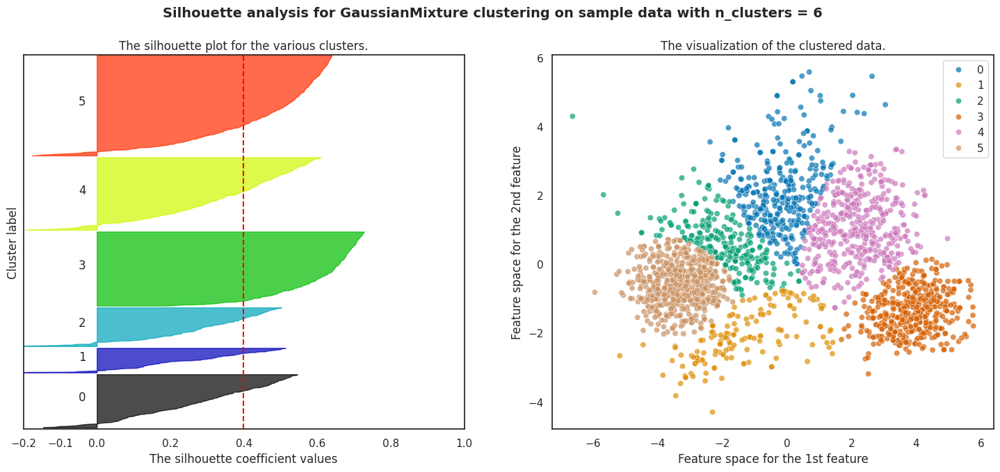

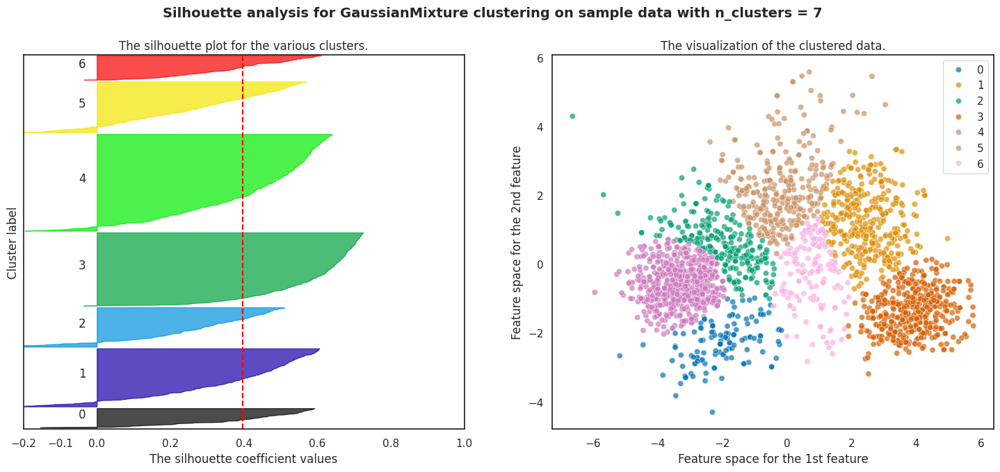

In [ ]:
#plotting silhoutte score for Gaussian score
from sklearn.mixture import GaussianMixture
silhouette_plot(GaussianMixture,range(3,8),pcadf,reduced)

### for Gaussian Mixture
#### For n_clusters = 3 The average silhouette_score is : 0.48

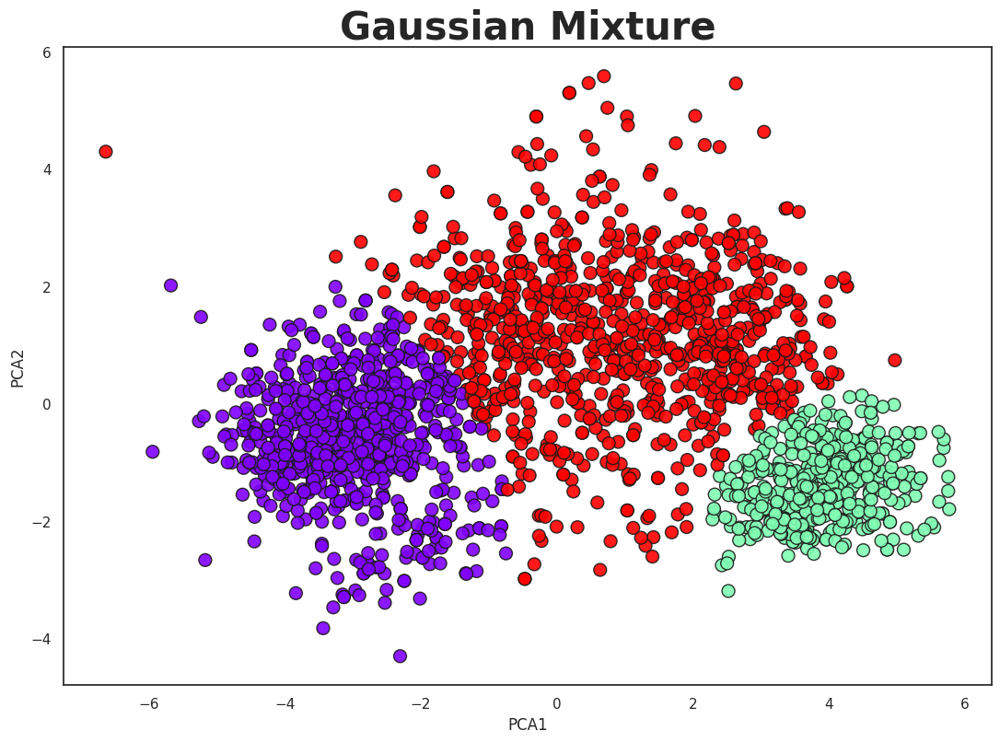

In [ ]:
#plotting gaussian mixture with 4 clusters
model = GaussianMixture(n_components=3,random_state=42).fit(reduced)
model_label = model.predict(reduced)
plt.figure(figsize=(13,9))

sns.set_style('white')
plt.title('Gaussian Mixture', weight='bold', size=30)
plt.xlabel('PCA1')
plt.ylabel('PCA2')
scatter = plt.scatter(pcadf['PC1'], pcadf['PC2'], c=model_label, s=100, cmap='rainbow', ec='k', alpha=0.9)
plt.show()

# DBSCAN Clustering

* Density-based spatial clustering of applications with noise (DBSCAN) is a data clustering algorithm.
* DBSCAN algorithm group points based on distance measurement, usually the Euclidean distance and the minimum number of points. An essential property of this algorithm is that it helps us track down the outliers as the points in low-density regions; hence it is not sensitive to outliers as is the case of K-Means clustering.

**Minimum Points minPts**

In DBSCAN minPts is the minimum number of data points that should be there in the region to define the cluster. You can choose the value of minPts based on your domain knowledge. But if you lack domain knowledge a good reference point is to have minPts ≥ D + 1 where D is the dimension of the dataset.

It is recommended to keep the value for the minPts at least 3, but for larger data sets, a greater minPts value should be chosen, especially if it has many outliers.

Finding the Optimal value of Epsilon

Rather than experimenting with different values of epsilon, we can use the elbow point detection method to arrive at a suitable value of epsilon.

In this approach, the average distance between each point and its k nearest neighbors is calculated where k = the MinPts selected.

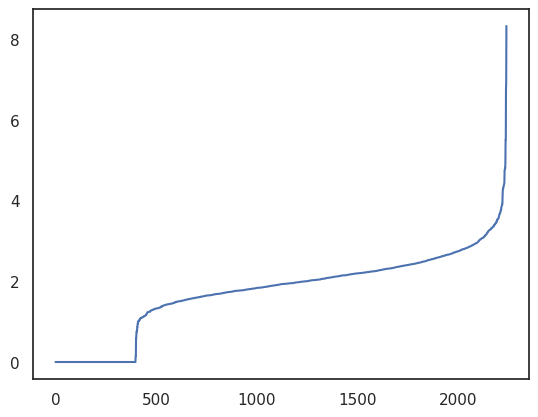

In [ ]:
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN

neighbors = NearestNeighbors(n_neighbors=17)
neighbors_fit = neighbors.fit(df_scaled)
distances, indices = neighbors_fit.kneighbors(df_scaled)

distances = np.sort(distances, axis=0)

distances = distances[:,1]
plt.plot(distances)
plt.show()

**Kneedle algorithm**
* We’ll use the Kneedle algorithm here via Kevin Arvai’s excellent Python implementation called Kneed. You can download this via PyPi by entering `pip3 install kneed` into your terminal and then importing the package with `from kneed import KneeLocator`.**bold text**

In [ ]:
!pip install kneed
from kneed import KneeLocator

<Figure size 500x500 with 0 Axes>

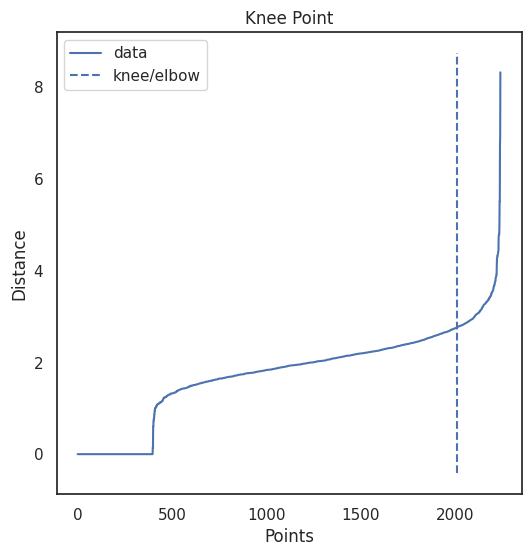

Knee Locator k = 2.7566368787163147


In [ ]:
i = np.arange(len(distances))
knee = KneeLocator(i, distances, S=1, curve='convex', direction='increasing', interp_method='polynomial')

fig = plt.figure(figsize=(5, 5))
knee.plot_knee()
plt.xlabel("Points")
plt.ylabel("Distance")
plt.show()
k= distances[knee.knee]
print('Knee Locator k =', k)

For 2-dimensional data, use DBSCAN’s default value of MinPts = 4 (Ester et al., 1996).

**DBSCAN algorithm works with two parameters.**

These parameters are:

* Epsilon (Eps): This is the least distance required for two points to be termed as a neighbor. This distance is known as Epsilon (Eps). Thus we consider Eps as a threshold for considering two points as neighbors, i.e., if the distance between two points is utmost Eps, then we consider the two points to be neighbors.

* MinPoints: This refers to the minimum number of points needed to construct a cluster. We consider MinPoints as a threshold for considering a cluster as a cluster. A cluster is only recognized if the number of points is greater than or equal to the MinPts.


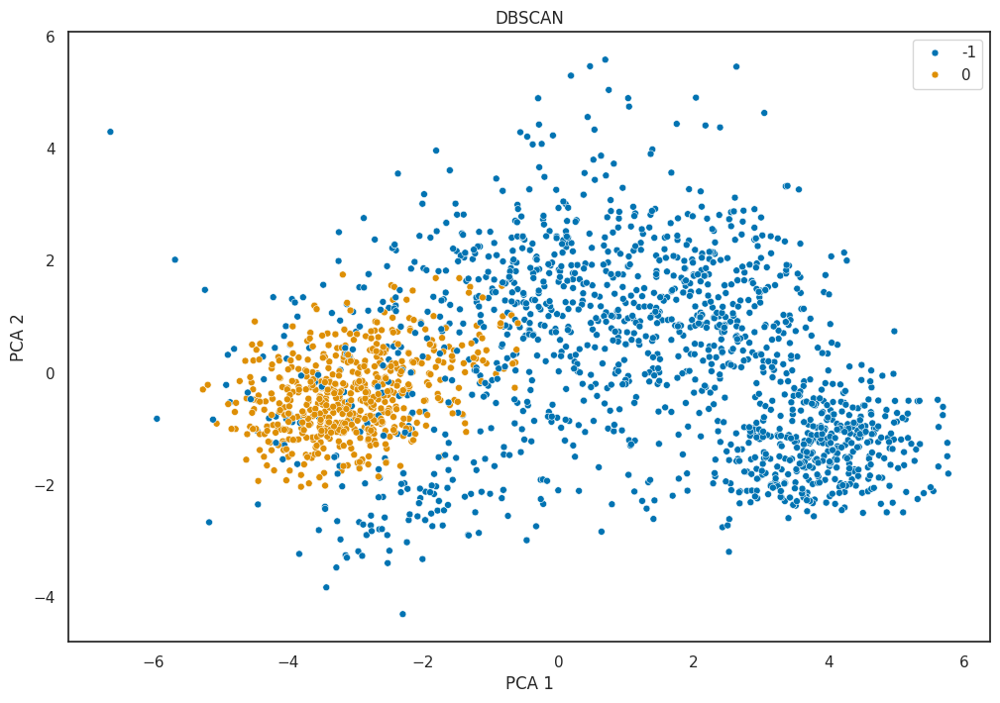

In [ ]:
model=DBSCAN(eps=k , min_samples=100).fit(df_scaled)
model_label = model.labels_
plt.figure(figsize=(12,8))

plt.title('DBSCAN')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
scatter = sns.scatterplot(x=reduced[:,0], y=reduced[:,1], hue=model_label,
                          palette=sns.color_palette("colorblind", len(set(model_label))), s=25)

### DBSCAN didn't perform well in clustering.
- Its clear that DBSCAN does not work to well when we are dealing with clusters of varying densities or with high dimensional data

# Final Model

As Kmeans Clustering performed well than rest of the other algorithms, we will go with this

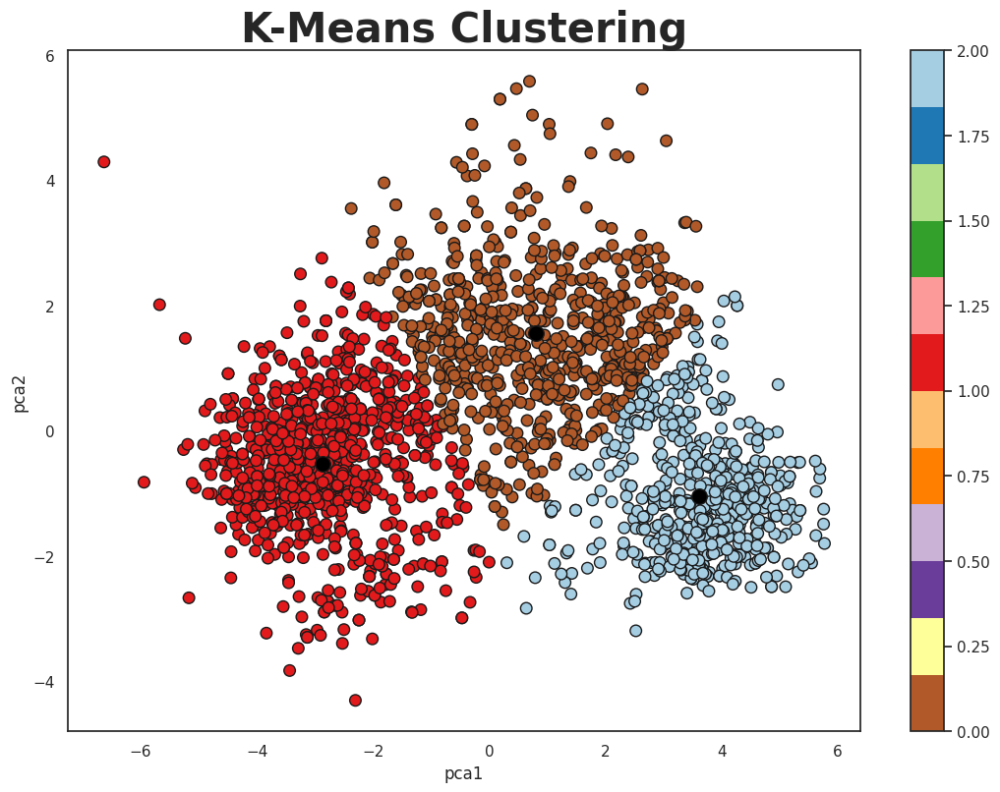

In [ ]:
# Fitting the model to reduced data
model = KMeans(n_clusters=3).fit(pcadf)
model_label = model.labels_
model_centers = model.cluster_centers_

#Plotting the clusters
plt.figure(figsize=(13,9))
plt.title('K-Means Clustering', weight='bold', size=30)
plt.xlabel('pca1')
plt.ylabel('pca2')
scatter = plt.scatter(pcadf['PC1'], pcadf['PC2'], c=model_label, s=70, cmap='Paired_r', ec='k')
plt.colorbar(scatter)
plt.scatter(model_centers[:,0], model_centers[:,1], c='black', marker='.',s=500, ec='k');

Saving the data with cluster column

In [ ]:
#save model labels as new feature
import os
df["cluster"] = model.labels_.astype(int)
df.to_csv("clustered_data.csv", index=False)

from google.colab import files
files.download("clustered_data.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Final report
- As we got the EDA results, we used that same approaches here also. We extracted out some features to derive valuable meanings from the data and used those in model training.
- The data had outliers and multicollinearity, We created pipelines to handle those things
- We have used PCA to minimize the dimensionality of the data.
- Kmeans Clustering algorithm has performed better then rest of the other clustering algorithms. So we went with it.

In [ ]:
import pandas as pd

In [ ]:
df = pd.DataFrame({
    'Customer_ID': range(1, 21),
    'Recency': [5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100],
    'Frequency': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21],
    'Monetry': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200, 1300, 1400, 1500, 1600, 1700, 1800, 1900, 2000],
    'Income': [20000, 25000, 30000, 35000, 40000, 45000, 50000, 55000, 60000, 65000, 70000, 75000, 80000, 85000, 90000, 95000, 100000, 105000, 110000, 115000]
})

print("ORIGINAL DATA (20 rows):")
print("="*100)
print(df)

print("\n\n" + "="*100)
print("APPLYING RFM SCORING WITH pd.qcut()")
print("="*100)

# Recency: low value is better (4=best, 1=worst)
df['R_score'] = pd.qcut(df['Recency'], q=4, labels=[4, 3, 2, 1], duplicates='drop')

# Frequency: high value is better (1=worst, 4=best)
df['F_score'] = pd.qcut(df['Frequency'], q=4, labels=[1, 2, 3, 4], duplicates='drop')

# Monetary: high value is better (1=worst, 4=best)
df['M_score'] = pd.qcut(df['Monetry'], q=4, labels=[1, 2, 3, 4], duplicates='drop')

# Income_flag: high value is better
df['Income_flag'] = pd.qcut(df['Income'], q=3, labels=['Low Income', 'Average Income', 'High Income'], duplicates='drop')

print("\nRESULT WITH SCORES:")
print(df)

print("\n\n" + "="*100)
print("COUNT IN EACH BIN (EQUAL DISTRIBUTION CHECK)")
print("="*100)

print("\nR_score distribution (Recency):")
print(df['R_score'].value_counts().sort_index())
print(f"Total: {df['R_score'].value_counts().sum()}")

print("\n\nF_score distribution (Frequency):")
print(df['F_score'].value_counts().sort_index())
print(f"Total: {df['F_score'].value_counts().sum()}")

print("\n\nM_score distribution (Monetary):")
print(df['M_score'].value_counts().sort_index())
print(f"Total: {df['M_score'].value_counts().sum()}")

print("\n\nIncome_flag distribution (Income):")
print(df['Income_flag'].value_counts())
print(f"Total: {df['Income_flag'].value_counts().sum()}")

print("\n\n" + "="*100)
print("EXPLANATION:")
print("="*100)
print("""
✓ 20 rows ÷ 4 bins = 5 rows in each bin (R_score, F_score, M_score)
✓ 20 rows ÷ 3 bins = 6-7 rows in each bin (Income_flag)

pd.qcut() = EQUAL FREQUENCY BINNING
→ Har ek category me SAME COUNT aayega (approximately equal)
→ Data ko quartiles/quantiles me divide karta hai

R_score (4 bins):
  - Bin 4: 5 rows (best recency - least days since purchase)
  - Bin 3: 5 rows
  - Bin 2: 5 rows
  - Bin 1: 5 rows (worst recency - most days since purchase)

F_score (4 bins):
  - Bin 1: 5 rows (worst frequency - least purchases)
  - Bin 2: 5 rows
  - Bin 3: 5 rows
  - Bin 4: 5 rows (best frequency - most purchases)

M_score (4 bins):
  - Bin 1: 5 rows (lowest spending)
  - Bin 2: 5 rows
  - Bin 3: 5 rows
  - Bin 4: 5 rows (highest spending)

Income_flag (3 bins):
  - Low Income: 7 rows
  - Average Income: 7 rows
  - High Income: 6 rows
""")

ORIGINAL DATA (20 rows):
    Customer_ID  Recency  Frequency  Monetry  Income
0             1        5          2      100   20000
1             2       10          3      200   25000
2             3       15          4      300   30000
3             4       20          5      400   35000
4             5       25          6      500   40000
5             6       30          7      600   45000
6             7       35          8      700   50000
7             8       40          9      800   55000
8             9       45         10      900   60000
9            10       50         11     1000   65000
10           11       55         12     1100   70000
11           12       60         13     1200   75000
12           13       65         14     1300   80000
13           14       70         15     1400   85000
14           15       75         16     1500   90000
15           16       80         17     1600   95000
16           17       85         18     1700  100000
17           18      